# Target Ensemble

Apart from the main target, there are actually many auxilliary targets in the dataset.

These targets are fundamentally related to the main target which make them potentially helpful to model. And because these targets have a wide range of correlations to the main targets, it means that we could potentially build some nice ensembles to boost our performance.

In [1]:
# Install dependencies
!pip install -q numerapi pandas pyarrow matplotlib lightgbm scikit-learn cloudpickle seaborn scipy==1.10.1

# Inline plots
%matplotlib inline

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.4/34.4 MB 7.1 MB/s eta 0:00:00


In [77]:
import seaborn as sns
colors20 = sns.color_palette('hls', 20)
colors40 = sns.color_palette('hls', 40)

df.to_csv('/content/drive/My Drive/df.csv', index=False)

In [57]:
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## View Auxilliary Targets


In [2]:
import pandas as pd
import json
from numerapi import NumerAPI

# Set the data version to one of the most recent versions
DATA_VERSION = "v4.3"

# Download data
napi = NumerAPI()
napi.download_dataset(f"{DATA_VERSION}/train_int8.parquet");
napi.download_dataset(f"{DATA_VERSION}/features.json");

# Load data
feature_metadata = json.load(open(f"{DATA_VERSION}/features.json"))
feature_cols = feature_metadata["feature_sets"]["medium"]
target_cols = feature_metadata["targets"]
train = pd.read_parquet(
    f"{DATA_VERSION}/train_int8.parquet",
    columns=["era"] + feature_cols + target_cols
)

# Downsample to every 4th era to reduce memory usage and speedup model training
# Comment out the line below to use all the data (higher memory usage, slower model training, potentially better performance)
train = train[train["era"].isin(train["era"].unique()[::4])]

# Print target columns
train[["era"] + target_cols]

v4.3/train_int8.parquet: 2.09GB [00:57, 36.7MB/s]                            
v4.3/features.json: 1.12MB [00:00, 3.48MB/s]                           


,era,target,target_tyler_v4_20,target_tyler_v4_60,target_victor_v4_20,target_victor_v4_60,target_ralph_v4_20,target_ralph_v4_60,target_waldo_v4_20,target_waldo_v4_60,...,target_jeremy_v4_20,target_jeremy_v4_60,target_teager_v4_20,target_teager_v4_60,target_agnes_v4_20,target_agnes_v4_60,target_claudia_v4_20,target_claudia_v4_60,target_rowan_v4_20,target_rowan_v4_60
id,,,,,,,,,,,,,,,,,,,,,
n003bba8a98662e4,0001,0.25,0.50,0.25,0.25,0.00,0.25,0.25,0.50,0.25,...,0.25,0.25,0.50,0.75,0.25,0.00,0.50,0.50,0.50,0.75
n003bee128c2fcfc,0001,0.75,0.75,0.75,0.75,0.75,0.75,0.75,0.75,1.00,...,0.75,1.00,1.00,0.75,1.00,1.00,1.00,0.75,1.00,0.75
n0048ac83aff7194,0001,0.25,0.50,0.50,0.50,0.25,0.50,0.25,0.50,0.25,...,0.50,0.25,0.25,0.25,0.25,0.25,0.25,0.25,0.25,0.25
n00691bec80d3e02,0001,0.75,0.50,0.75,0.75,0.50,0.75,0.50,0.50,0.50,...,0.50,0.50,0.75,0.75,0.50,0.50,0.75,0.75,0.75,0.50
n00b8720a2fdc4f2,0001,0.50,0.75,0.75,0.75,0.50,0.50,0.50,0.50,0.50,...,0.50,0.50,0.50,0.50,0.50,0.50,0.50,0.50,0.50,0.50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
nffc2d5e4b79a7ae,0573,0.25,0.25,0.50,0.25,0.50,0.25,0.50,0.00,0.50,...,0.00,0.25,0.00,0.25,0.00,0.50,0.25,0.50,0.00,0.25
nffc7d24176548a4,0573,0.50,0.50,0.25,0.50,0.50,0.50,0.25,0.50,0.25,...,0.50,0.25,0.50,0.50,0.50,0.25,0.50,0.25,0.25,0.50
nffc9844c1c7a6a9,0573,0.50,0.50,0.50,0.50,0.50,0.25,0.50,0.25,0.50,...,0.50,0.50,0.50,0.50,0.50,0.50,0.50,0.50,0.25,0.75


### The main target

First thing to note is that `target` is just an alias for `target_cyrus_v4_20`, so we can drop this column for the rest of the notebook.

In [3]:
# Drop `target` column
assert train["target"].equals(train["target_cyrus_v4_20"])
target_names = target_cols[1:]
targets_df = train[["era"] + target_names]

### Target names

At a high level, each target represents a different kind of stock market return
- the `name` represents the type of stock market return (eg. residual to market/country/sector vs market/country/style)
- the `_20` or `_60` suffix denotes the time horizon of the target (ie. 20 vs 60 market days)

The reason why `target_cyrus_v4_20` is our main target is because it most closely matches the type of returns we want for our hedge fund. Just like how we are always in search for better features to include in the dataset, we are also always in search for better targets to make our main target. During our research, we often come up with targets we like but not as much as the main target, and these are instead released as auxilliary targets.

In [4]:
# Print target names grouped by name and time horizon
pd.set_option('display.max_rows', 100)
t20s = [t for t in target_names if t.endswith("_20")]
t60s = [t for t in target_names if t.endswith("_60")]
names = [t[7:-6] for t in t20s]
pd.DataFrame({"name": names,"20": t20s,"60": t60s}).set_index("name")

,20,60
name,,
tyler,target_tyler_v4_20,target_tyler_v4_60
victor,target_victor_v4_20,target_victor_v4_60
ralph,target_ralph_v4_20,target_ralph_v4_60
waldo,target_waldo_v4_20,target_waldo_v4_60
cyrus,target_cyrus_v4_20,target_cyrus_v4_60
caroline,target_caroline_v4_20,target_caroline_v4_60
sam,target_sam_v4_20,target_sam_v4_60
xerxes,target_xerxes_v4_20,target_xerxes_v4_60
alpha,target_alpha_v4_20,target_alpha_v4_60


### Target values

Note that some targets are binned into 5 bins while others are binned into 7 bins.

Unlike feature values which are integers ranging from 0-4, target values are floats which range from 0-1.

array([[<Axes: >, <Axes: >],
       [<Axes: >, <Axes: >],
       [<Axes: >, <Axes: >],
       [<Axes: >, <Axes: >],
       [<Axes: >, <Axes: >],
       [<Axes: >, <Axes: >],
       [<Axes: >, <Axes: >],
       [<Axes: >, <Axes: >],
       [<Axes: >, <Axes: >],
       [<Axes: >, <Axes: >],
       [<Axes: >, <Axes: >],
       [<Axes: >, <Axes: >],
       [<Axes: >, <Axes: >],
       [<Axes: >, <Axes: >],
       [<Axes: >, <Axes: >],
       [<Axes: >, <Axes: >],
       [<Axes: >, <Axes: >],
       [<Axes: >, <Axes: >],
       [<Axes: >, <Axes: >],
       [<Axes: >, <Axes: >]], dtype=object)

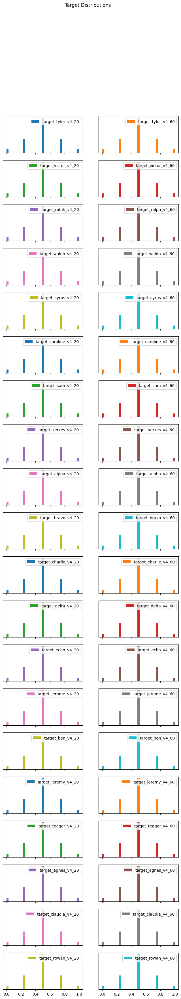

In [5]:
# Plot target distributions
targets_df.plot(
  title="Target Distributions",
  kind="hist",
  bins=35,
  density=True,
  figsize=(8, 40),
  subplots=True,
  layout=(20, 2),
  ylabel="",
  yticks=[]
)

It is also important to note that the auxilary targets can be `NaN`, but the primary target will never be `NaN`. Since we are using tree-based models here we won't need to do any special pre-processing.

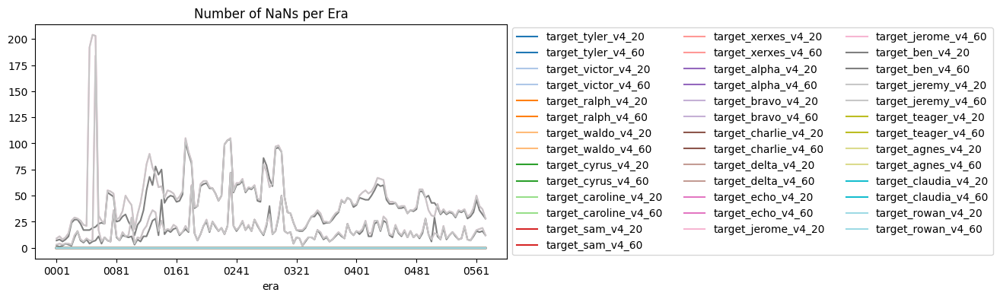

In [6]:
import matplotlib.pyplot as plt

# print number of NaNs per era
nans_per_era = targets_df.groupby("era").apply(lambda x: x.isna().sum())
ax = nans_per_era[target_names].plot(figsize=(8, 4), title="Number of NaNs per Era", legend=True, colormap='tab20')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=3)
plt.show()

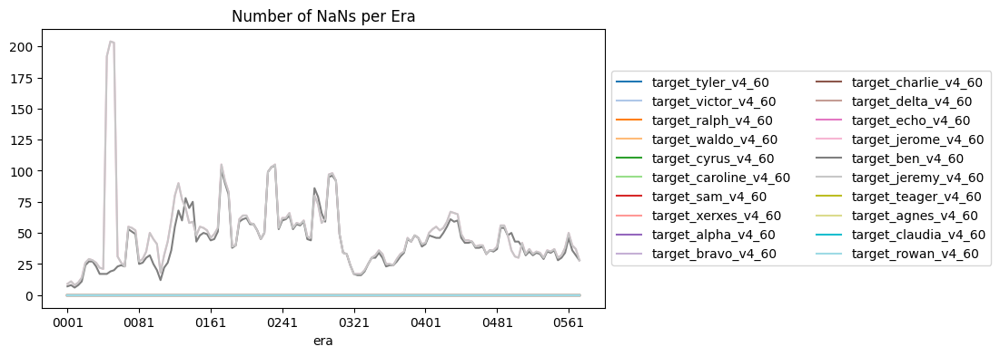

In [7]:
# print number of NaNs per era
nans_per_era = targets_df.groupby("era").apply(lambda x: x.isna().sum())
ax = nans_per_era[t60s].plot(figsize=(8, 4), title="Number of NaNs per Era", legend=True, colormap='tab20')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2)
plt.show()

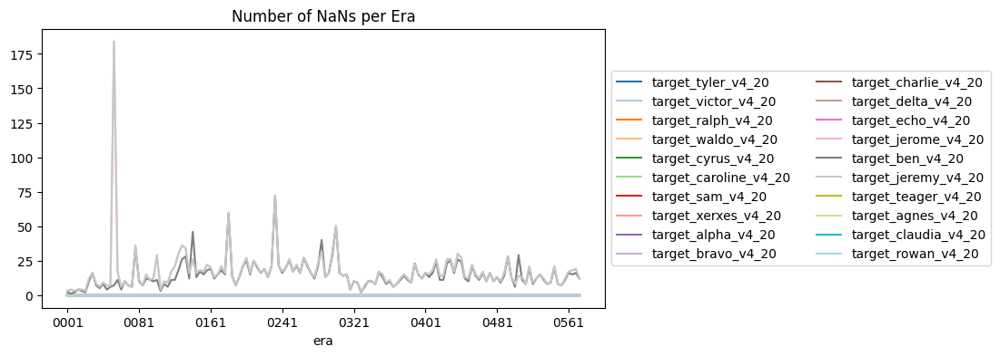

In [8]:
# print number of NaNs per era
nans_per_era = targets_df.groupby("era").apply(lambda x: x.isna().sum())
ax = nans_per_era[t20s].plot(figsize=(8, 4), title="Number of NaNs per Era", legend=True, colormap='tab20')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2)
plt.show()

### Target correlations

The targets have a wide range of correlations with each other even though they are all fundamentally related, which should allow the construction of diverse models that ensemble together nicely.

<Axes: >

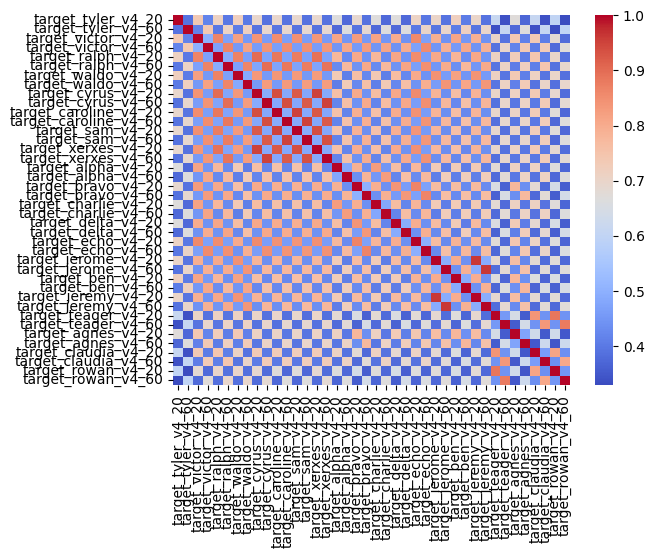

In [9]:
# Plot correlation matrix of targets
import seaborn as sns
sns.heatmap(
  targets_df[target_names].corr(),
  cmap="coolwarm",
  xticklabels=True,
  yticklabels=True
)

Since we are ultimately trying to predict the main target (`target_cyrus_v4_20`), it is perhaps most important to consider each auxilliary target's correlation to it.

In [10]:
(
    targets_df[target_names]
    .corrwith(targets_df["target_cyrus_v4_20"])
    .sort_values(ascending=False)
    .to_frame("corr_with_cyrus_v4_20")
)

,corr_with_cyrus_v4_20
target_cyrus_v4_20,1.000000
target_xerxes_v4_20,0.951474
target_caroline_v4_20,0.938870
target_sam_v4_20,0.923488
target_ralph_v4_20,0.898095
target_echo_v4_20,0.853768
target_victor_v4_20,0.841411
target_waldo_v4_20,0.833776
target_delta_v4_20,0.807416
target_bravo_v4_20,0.803201


## 2. Target Selection

Our goal is to create an ensemble of models trained on different targets. But which targets should we use?

When deciding which model to ensemble, we should consider a few things:

- The performance of the predictions of the model trained on the target vs the main target

- The correlation between the target and the main target

To keep things simple and fast, let's just arbitrarily pick a few 20-day targets to evaluate.

In [11]:
# pick a few 20-day target candidates
target_candidates = t20s

### Model training and generating validation predictions

Like usual we train on the training dataset, but this time we do it for each target.

Sit back and relax, this will take a while
# ☕

In [12]:
import lightgbm as lgb

models = {}
for target in target_candidates:
    model = lgb.LGBMRegressor(
        n_estimators=2000,
        learning_rate=0.01,
        max_depth=5,
        num_leaves=2**4-1,
        colsample_bytree=0.1
    )
    model.fit(
        train[feature_cols],
        train[target]
    );
    models[target] = model

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.272770 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3525
[LightGBM] [Info] Number of data points in the train set: 606176, number of used features: 705
[LightGBM] [Info] Start training from score 0.499941
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.279179 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3525
[LightGBM] [Info] Number of data points in the train set: 606176, number of used features: 705
[LightGBM] [Info] Start training from score 0.500008
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.144064 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not e

In [13]:
models

{'target_tyler_v4_20': LGBMRegressor(colsample_bytree=0.1, learning_rate=0.01, max_depth=5,
               n_estimators=2000, num_leaves=15),
 'target_victor_v4_20': LGBMRegressor(colsample_bytree=0.1, learning_rate=0.01, max_depth=5,
               n_estimators=2000, num_leaves=15),
 'target_ralph_v4_20': LGBMRegressor(colsample_bytree=0.1, learning_rate=0.01, max_depth=5,
               n_estimators=2000, num_leaves=15),
 'target_waldo_v4_20': LGBMRegressor(colsample_bytree=0.1, learning_rate=0.01, max_depth=5,
               n_estimators=2000, num_leaves=15),
 'target_cyrus_v4_20': LGBMRegressor(colsample_bytree=0.1, learning_rate=0.01, max_depth=5,
               n_estimators=2000, num_leaves=15),
 'target_caroline_v4_20': LGBMRegressor(colsample_bytree=0.1, learning_rate=0.01, max_depth=5,
               n_estimators=2000, num_leaves=15),
 'target_sam_v4_20': LGBMRegressor(colsample_bytree=0.1, learning_rate=0.01, max_depth=5,
               n_estimators=2000, num_leaves=15),
 'ta

Then we will generate predictions on the validation dataset.

In [14]:
# Download validation data
napi.download_dataset(f"{DATA_VERSION}/validation_int8.parquet");

# Load the validation data, filtering for data_type == "validation"
validation = pd.read_parquet(
    f"{DATA_VERSION}/validation_int8.parquet",
    columns=["era", "data_type"] + feature_cols + target_cols
)
validation = validation[validation["data_type"] == "validation"]
del validation["data_type"]

# Downsample every 4th era to reduce memory usage and speedup validation (suggested for Colab free tier)
# Comment out the line below to use all the data
validation = validation[validation["era"].isin(validation["era"].unique()[::4])]

# Embargo overlapping eras from training data
last_train_era = int(train["era"].unique()[-1])
eras_to_embargo = [str(era).zfill(4) for era in [last_train_era + i for i in range(4)]]
validation = validation[~validation["era"].isin(eras_to_embargo)]

# Generate validation predictions for each model
for target in target_candidates:
    validation[f"prediction_{target}"] = models[target].predict(validation[feature_cols])

pred_cols = [f"prediction_{target}" for target in target_candidates]
validation[pred_cols]

v4.3/validation_int8.parquet: 2.54GB [01:01, 41.3MB/s]                            


,prediction_target_tyler_v4_20,prediction_target_victor_v4_20,prediction_target_ralph_v4_20,prediction_target_waldo_v4_20,prediction_target_cyrus_v4_20,prediction_target_caroline_v4_20,prediction_target_sam_v4_20,prediction_target_xerxes_v4_20,prediction_target_alpha_v4_20,prediction_target_bravo_v4_20,prediction_target_charlie_v4_20,prediction_target_delta_v4_20,prediction_target_echo_v4_20,prediction_target_jerome_v4_20,prediction_target_ben_v4_20,prediction_target_jeremy_v4_20,prediction_target_teager_v4_20,prediction_target_agnes_v4_20,prediction_target_claudia_v4_20,prediction_target_rowan_v4_20
id,,,,,,,,,,,,,,,,,,,,
n002a15bc5575bbb,0.498379,0.499653,0.501692,0.502100,0.503052,0.505546,0.503763,0.503619,0.499276,0.508746,0.498924,0.499884,0.500137,0.499443,0.488788,0.499079,0.499285,0.494302,0.498424,0.496961
n00309caaa0f955e,0.512803,0.517162,0.514739,0.519069,0.509751,0.507183,0.508087,0.507413,0.516365,0.518566,0.515396,0.514791,0.515110,0.519694,0.513978,0.520175,0.509334,0.517866,0.510103,0.506830
n00576b397182463,0.488485,0.492894,0.497005,0.494858,0.495432,0.498546,0.495360,0.495017,0.496960,0.501875,0.498970,0.506986,0.496100,0.489673,0.501628,0.489349,0.498903,0.512041,0.500043,0.496910
n00633405d59c6a1,0.504713,0.501327,0.506363,0.501229,0.507279,0.503629,0.502987,0.500515,0.504949,0.503575,0.504835,0.510506,0.511188,0.496329,0.503978,0.497965,0.503678,0.515938,0.504806,0.500858
n008c2eefc8911c7,0.495115,0.498874,0.493600,0.497039,0.494764,0.495529,0.494864,0.493861,0.497768,0.493577,0.501548,0.500826,0.493712,0.493501,0.485563,0.493565,0.497294,0.493419,0.495536,0.497027
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
nffd77a37de089b5,0.497401,0.494268,0.501611,0.502302,0.500756,0.497699,0.493991,0.499424,0.496255,0.502215,0.495746,0.499097,0.500113,0.505836,0.502218,0.505966,0.499603,0.494400,0.500117,0.498725
nffda7089c354475,0.483671,0.493136,0.482640,0.479405,0.485334,0.490393,0.490887,0.490576,0.493983,0.490658,0.491934,0.487297,0.486468,0.480272,0.488424,0.480583,0.486600,0.497936,0.488816,0.488616
nffdf196e122fbea,0.498301,0.500018,0.502434,0.508342,0.501598,0.499032,0.497253,0.502138,0.502328,0.504126,0.500811,0.501036,0.502740,0.508513,0.507436,0.508993,0.498642,0.503345,0.497823,0.500726


from matplotlib import pyplot as plt
_df_0['prediction_target_tyler_v4_20'].plot(kind='hist', bins=20, title='prediction_target_tyler_v4_20')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['prediction_target_victor_v4_20'].plot(kind='hist', bins=20, title='prediction_target_victor_v4_20')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2['prediction_target_ralph_v4_20'].plot(kind='hist', bins=20, title='prediction_target_ralph_v4_20')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_3['prediction_target_waldo_v4_20'].plot(kind='hist', bins=20, title='prediction_target_waldo_v4_20')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_4.plot(kind='scatter', x='prediction_target_tyler_v4_20', y='prediction_target_victor_v4_20', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_5.plot(kind='scatter', x='prediction_target_victor_v4_20', y='prediction_target_ralph_v4_20', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_6.plot(kind='scatter', x='prediction_target_ralph_v4_20', y='prediction_target_waldo_v4_20', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_7.plot(kind='scatter', x='prediction_target_waldo_v4_20', y='prediction_target_cyrus_v4_20', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_8['prediction_target_tyler_v4_20'].plot(kind='line', figsize=(8, 4), title='prediction_target_tyler_v4_20')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_9['prediction_target_victor_v4_20'].plot(kind='line', figsize=(8, 4), title='prediction_target_victor_v4_20')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_10['prediction_target_ralph_v4_20'].plot(kind='line', figsize=(8, 4), title='prediction_target_ralph_v4_20')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_11['prediction_target_waldo_v4_20'].plot(kind='line', figsize=(8, 4), title='prediction_target_waldo_v4_20')
plt.gca().spines[['top', 'right']].set_visible(False)

In [58]:
# Save data to Google Drive
#validation[pred_cols].to_csv('/content/drive/My Drive/validation_pred_cols.csv', index=False)

### Evaluating the performance of each model

Now we can evaluate the performance of our models.

In [15]:
# install Numerai's open-source scoring tools
!pip install -q --no-deps numerai-tools

# import the 2 scoring functions
from numerai_tools.scoring import numerai_corr, correlation_contribution

As you can see in the performance chart below, models trained on the auxiliary target are able to predict the main target pretty well, but the model trained on the main target performs the best.

In [60]:
prediction_cols = [
    f"prediction_{target}"
    for target in target_candidates
]
correlations = validation.groupby("era").apply(
    lambda d: numerai_corr(d[prediction_cols], d["target"])
)
cumsum_corrs_models = correlations.cumsum()

In [ ]:
selected_models = ["prediction_target_teager_v4_20", "prediction_target_victor_v4_20", "prediction_target_waldo_v4_20", "prediction_target_rowan_v4_20", "prediction_target_delta_v4_20"]

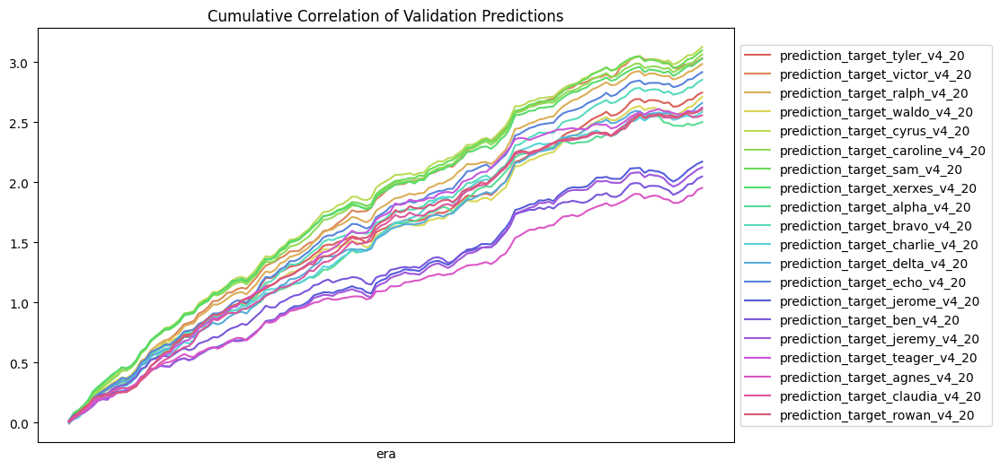

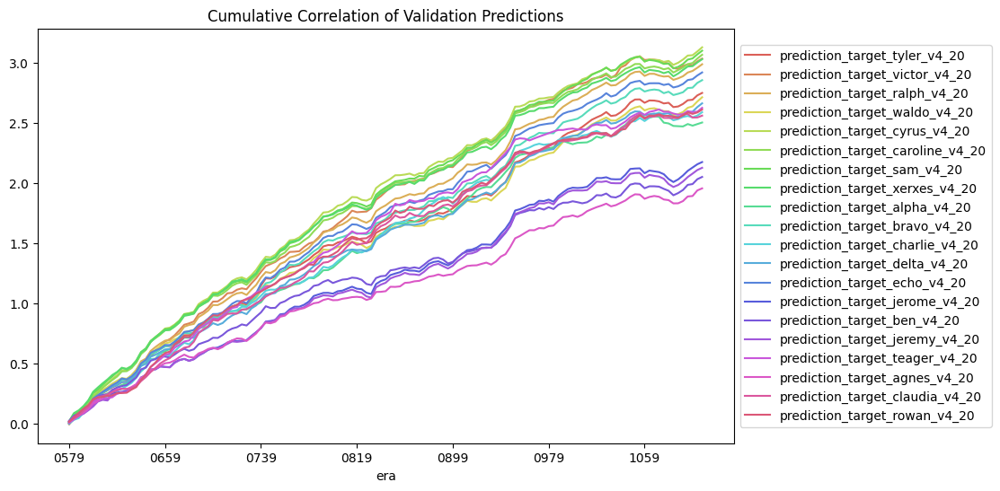

In [80]:
cumsum_corrs_models.plot(
  title="Cumulative Correlation of Validation Predictions",
  figsize=(10, 6),
  color=colors20,
  xticks=[]
)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
plt.show()
cumsum_corrs_models.plot(
  title="Cumulative Correlation of Validation Predictions",
  figsize=(10, 6),
  color=colors20
)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
plt.show()

<Axes: title={'center': 'Cumulative Correlation of Validation Predictions'}, xlabel='era'>

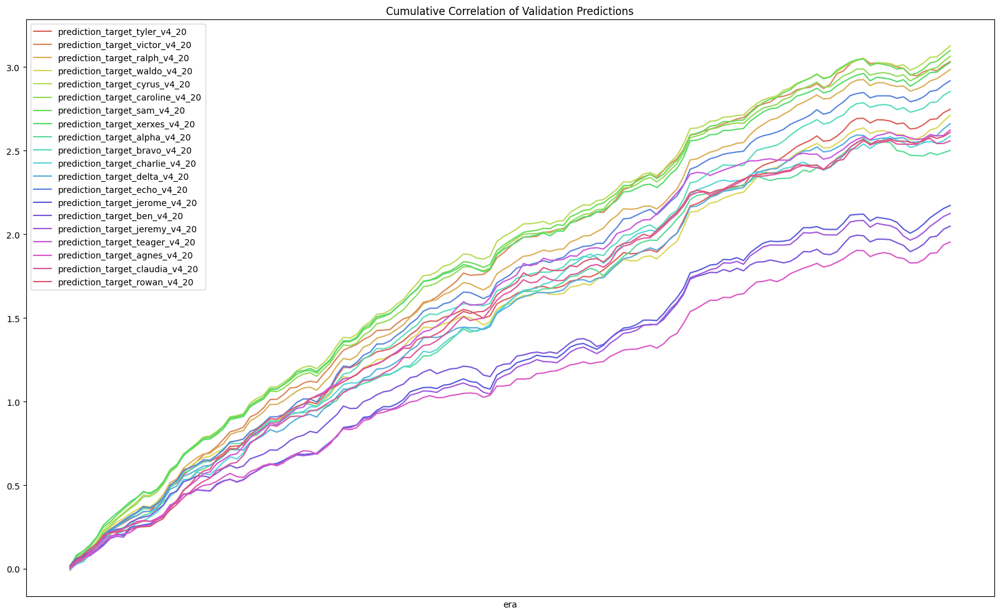

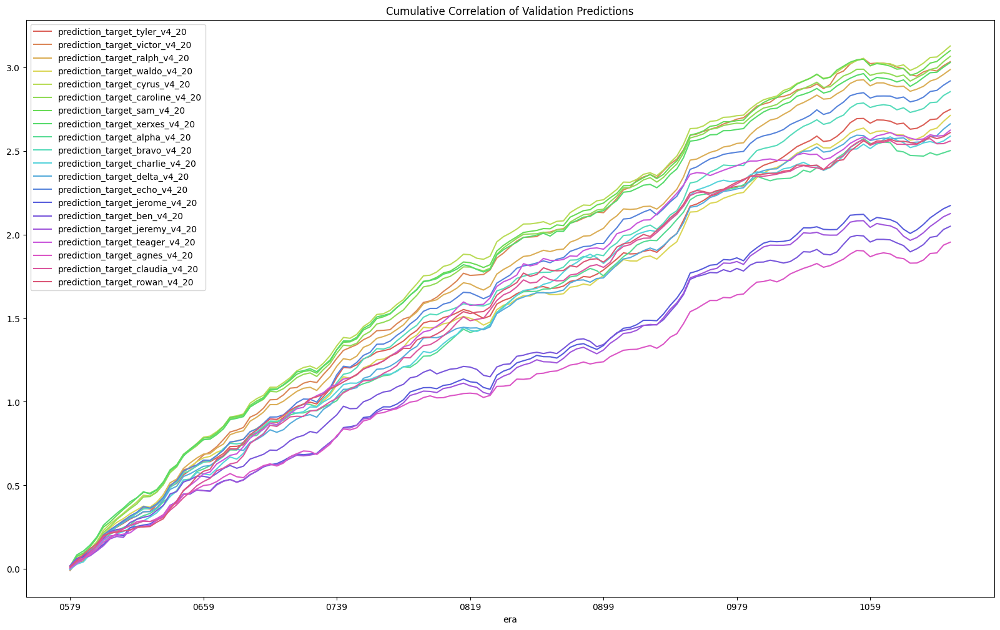

In [82]:
cumsum_corrs_models.plot(
  title="Cumulative Correlation of Validation Predictions",
  figsize=(20, 12),
  color=colors20,
  xticks=[]
)
cumsum_corrs_models.plot(
  title="Cumulative Correlation of Validation Predictions",
  figsize=(20, 12),
  color=colors20
)

<Axes: title={'center': 'Cumulative Correlation of Validation Predictions'}, xlabel='era'>

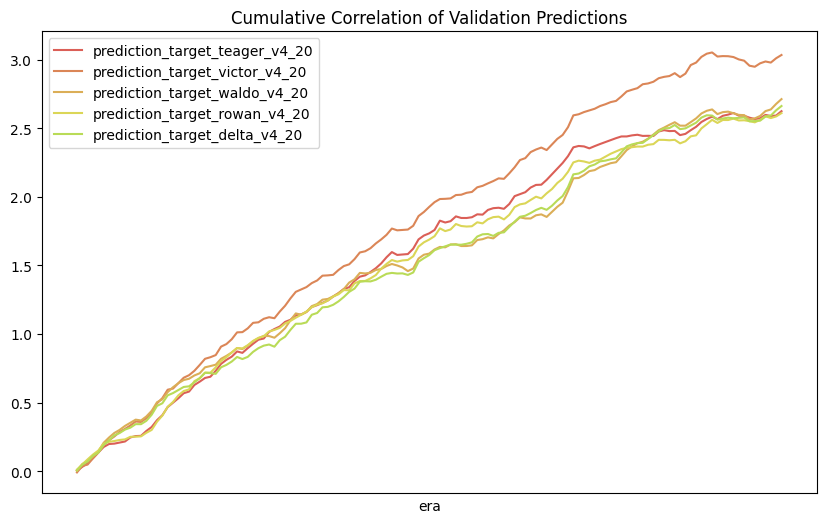

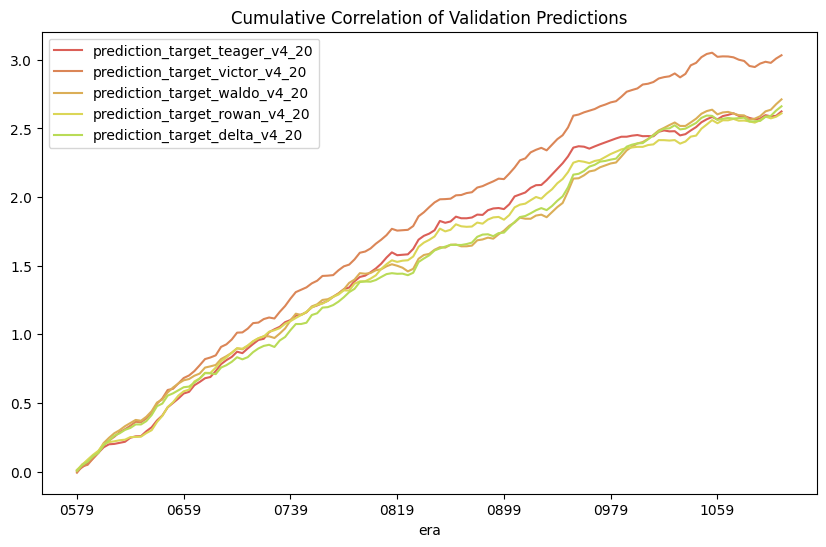

In [86]:
cumsum_corrs_models[selected_models].plot(
  title="Cumulative Correlation of Validation Predictions",
  figsize=(10, 6),
  color=colors20,
  xticks=[]
)
cumsum_corrs_models[selected_models].plot(
  title="Cumulative Correlation of Validation Predictions",
  figsize=(10, 6),
  color=colors20
)

<Axes: title={'center': 'Cumulative Correlation of Validation Predictions'}, xlabel='era'>

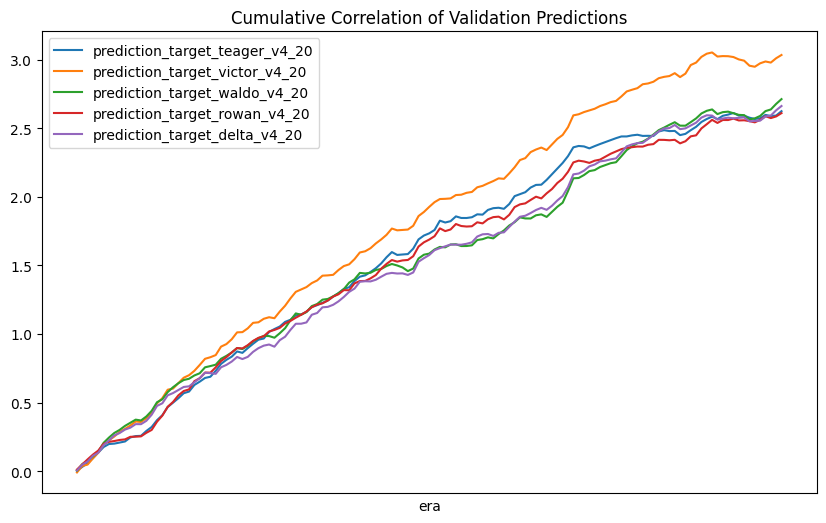

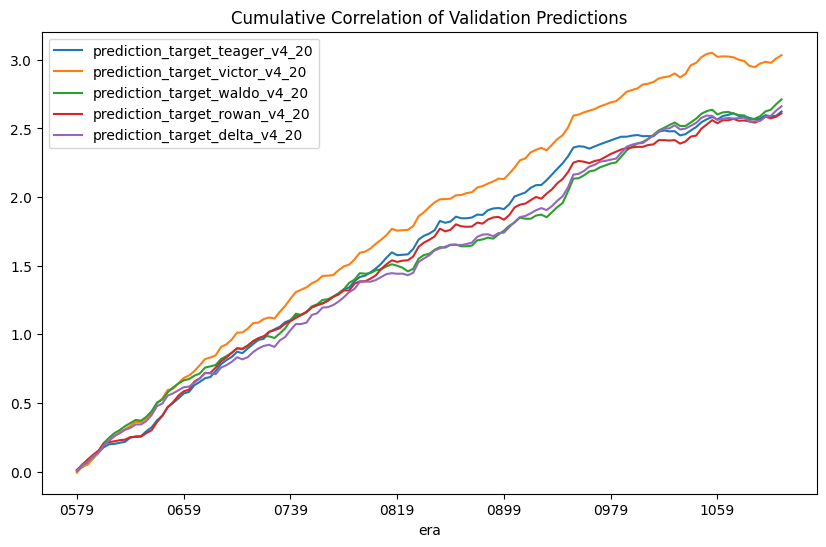

In [85]:
cumsum_corrs_models[selected_models].plot(
  title="Cumulative Correlation of Validation Predictions",
  figsize=(10, 6),
  xticks=[]
)
cumsum_corrs_models[selected_models].plot(
  title="Cumulative Correlation of Validation Predictions",
  figsize=(10, 6),
)

In [65]:
correlations

,prediction_target_tyler_v4_20,prediction_target_victor_v4_20,prediction_target_ralph_v4_20,prediction_target_waldo_v4_20,prediction_target_cyrus_v4_20,prediction_target_caroline_v4_20,prediction_target_sam_v4_20,prediction_target_xerxes_v4_20,prediction_target_alpha_v4_20,prediction_target_bravo_v4_20,prediction_target_charlie_v4_20,prediction_target_delta_v4_20,prediction_target_echo_v4_20,prediction_target_jerome_v4_20,prediction_target_ben_v4_20,prediction_target_jeremy_v4_20,prediction_target_teager_v4_20,prediction_target_agnes_v4_20,prediction_target_claudia_v4_20,prediction_target_rowan_v4_20
era,,,,,,,,,,,,,,,,,,,,
0579,-0.002855,-0.008886,0.000790,0.003640,0.010858,0.004606,0.014060,0.017732,0.006224,-0.003705,-0.002955,0.005131,0.001312,0.015639,0.020375,0.014134,0.003611,0.009592,0.015144,0.012413
0583,0.053680,0.047227,0.055679,0.048567,0.061995,0.058431,0.062368,0.066347,0.031867,0.044491,0.031321,0.042315,0.049478,0.038822,0.042317,0.035020,0.028265,0.042842,0.027705,0.037621
0587,0.016473,0.010144,0.006306,0.024326,0.017623,0.019262,0.018599,0.023586,0.021535,0.018787,0.014329,0.023213,0.016856,0.019882,0.016550,0.015205,0.026987,0.012820,0.020219,0.036549
0591,0.022361,0.045730,0.036249,0.031108,0.026019,0.029641,0.037836,0.035784,0.037362,0.029656,0.044754,0.041999,0.027548,0.013709,0.025105,0.014497,0.036472,0.021336,0.041148,0.034719
0595,0.043708,0.041918,0.036200,0.036085,0.046743,0.044886,0.051517,0.047235,0.040814,0.030951,0.028921,0.022199,0.045641,0.028563,0.033621,0.028941,0.040409,0.031535,0.034466,0.029371
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1091,0.020883,0.025108,0.017535,0.017580,0.026301,0.020826,0.024005,0.029796,-0.001963,0.012828,0.017753,0.002282,0.019130,0.032383,0.025519,0.029142,0.005209,0.018248,0.030799,0.018383
1095,0.030882,0.013288,0.030899,0.035384,0.033420,0.027920,0.036686,0.028577,0.019995,0.035040,0.007728,0.030212,0.033154,0.038851,0.042773,0.037133,0.024564,0.038553,0.003665,0.026126
1099,0.004153,-0.008021,0.013193,0.011979,0.002897,0.009622,0.009708,0.002838,-0.013429,0.003169,-0.011004,0.006825,0.006937,0.027781,0.006610,0.028354,-0.008148,0.003609,-0.030058,-0.013367


In [59]:
correlations.to_csv('/content/drive/My Drive/correlations.csv', index=False)

Looking at the summary metrics below:
- the models trained on `victor` and `xerxes` have the highest means, but `victor` is less correlated with `cyrus` than `xerxes` is, which means `victor` could be better in ensembling
- the model trained on `teager` has the lowest mean, but `teager` is significantly less correlated with `cyrus` than any other target shown

In [18]:
def get_summary_metrics(scores, cumsum_scores):
    summary_metrics = {}
    # per era correlation between predictions of the model trained on this target and cyrus
    mean = scores.mean()
    std = scores.std()
    sharpe = mean / std
    rolling_max = cumsum_scores.expanding(min_periods=1).max()
    max_drawdown = (rolling_max - cumsum_scores).max()
    return {
        "mean": mean,
        "std": std,
        "sharpe": sharpe,
        "max_drawdown": max_drawdown,
    }

target_summary_metrics = {}
for pred_col in prediction_cols:
  target_summary_metrics[pred_col] = get_summary_metrics(
      correlations[pred_col], cumsum_corrs[pred_col]
  )
  # per era correlation between this target and cyrus
  mean_corr_with_cryus = validation.groupby("era").apply(
      lambda d: d[pred_col].corr(d["target_cyrus_v4_20"])
  ).mean()
  target_summary_metrics[pred_col].update({
      "mean_corr_with_cryus": mean_corr_with_cryus
  })


pd.set_option('display.float_format', lambda x: '%f' % x)
summary = pd.DataFrame(target_summary_metrics).T
summary

,mean,std,sharpe,max_drawdown,mean_corr_with_cryus
prediction_target_tyler_v4_20,0.020659,0.021162,0.976262,0.064185,0.020812
prediction_target_victor_v4_20,0.022805,0.021036,1.084136,0.104255,0.022860
prediction_target_ralph_v4_20,0.022451,0.021538,1.042384,0.069092,0.022586
prediction_target_waldo_v4_20,0.020388,0.021202,0.961595,0.072561,0.020793
prediction_target_cyrus_v4_20,0.023511,0.022403,1.049468,0.072247,0.023815
prediction_target_caroline_v4_20,0.023046,0.021982,1.048434,0.071106,0.023358
prediction_target_sam_v4_20,0.023300,0.022018,1.058260,0.095833,0.023707
prediction_target_xerxes_v4_20,0.022768,0.022701,1.002958,0.076184,0.023173
prediction_target_alpha_v4_20,0.018809,0.019833,0.948354,0.105787,0.019083
prediction_target_bravo_v4_20,0.021458,0.021069,1.018456,0.056444,0.021292


### Selecting our favorite target
Based on our observations above, it seems like target `victor` is the best candidate target for our ensemble since it has great performance and it is not too correlated with `cyrus`. However, it's interesting to look at how models that are very uncorrelated ensemble together; we are going to also look at how `teager` ensembles with `cyrus`.

## Ensemble Predictions and Re-Evaluate Performance.

### Creating the ensemble

For simplicity, we will equal weight the predictions from target `victor` and `cyrus`.

Tip: remember to always normalize (percentile rank) your predictions before averaging so that they are comparable!

In [66]:
# Ensemble predictions together with a simple average
prediction_names = []
ensemble_names = []
for t in target_candidates:
  validation["ensemble_cyrus_" + t[7:][:-6]] = (
    validation
    .groupby("era")[[
      "prediction_target_cyrus_v4_20",
      "prediction_target_" + t[7:],
    ]]
    .rank(pct=True)
    .mean(axis=1)
  )
  prediction_names.append("prediction_target_" + t[7:])
  ensemble_names.append("ensemble_cyrus_" + t[7:][:-6])

In [143]:
all_ensemble_models = ["ensemble_cyrus_" + t[7:][:-6] for t in target_candidates]

In [144]:
all_ensemble_models

['ensemble_cyrus_tyler',
 'ensemble_cyrus_victor',
 'ensemble_cyrus_ralph',
 'ensemble_cyrus_waldo',
 'ensemble_cyrus_cyrus',
 'ensemble_cyrus_caroline',
 'ensemble_cyrus_sam',
 'ensemble_cyrus_xerxes',
 'ensemble_cyrus_alpha',
 'ensemble_cyrus_bravo',
 'ensemble_cyrus_charlie',
 'ensemble_cyrus_delta',
 'ensemble_cyrus_echo',
 'ensemble_cyrus_jerome',
 'ensemble_cyrus_ben',
 'ensemble_cyrus_jeremy',
 'ensemble_cyrus_teager',
 'ensemble_cyrus_agnes',
 'ensemble_cyrus_claudia',
 'ensemble_cyrus_rowan']

In [94]:
ensemble_models = ["ensemble_cyrus_teager", "ensemble_cyrus_victor", "ensemble_cyrus_waldo", "ensemble_cyrus_rowan", "ensemble_cyrus_delta"]
all_selected = selected_models + ensemble_models

In [67]:
# Print the ensemble predictions
prediction_cols = prediction_names + ensemble_names
validation[prediction_cols]

,prediction_target_tyler_v4_20,prediction_target_victor_v4_20,prediction_target_ralph_v4_20,prediction_target_waldo_v4_20,prediction_target_cyrus_v4_20,prediction_target_caroline_v4_20,prediction_target_sam_v4_20,prediction_target_xerxes_v4_20,prediction_target_alpha_v4_20,prediction_target_bravo_v4_20,...,ensemble_cyrus_charlie,ensemble_cyrus_delta,ensemble_cyrus_echo,ensemble_cyrus_jerome,ensemble_cyrus_ben,ensemble_cyrus_jeremy,ensemble_cyrus_teager,ensemble_cyrus_agnes,ensemble_cyrus_claudia,ensemble_cyrus_rowan
id,,,,,,,,,,,,,,,,,,,,,
n002a15bc5575bbb,0.498379,0.499653,0.501692,0.502100,0.503052,0.505546,0.503763,0.503619,0.499276,0.508746,...,0.532790,0.555578,0.570118,0.577542,0.429264,0.570633,0.541143,0.472881,0.510930,0.443700
n00309caaa0f955e,0.512803,0.517162,0.514739,0.519069,0.509751,0.507183,0.508087,0.507413,0.516365,0.518566,...,0.922046,0.893689,0.899979,0.903898,0.862343,0.905341,0.907507,0.887193,0.908847,0.881728
n00576b397182463,0.488485,0.492894,0.497005,0.494858,0.495432,0.498546,0.495360,0.495017,0.496960,0.501875,...,0.356775,0.513302,0.312436,0.260466,0.421015,0.255929,0.347597,0.542895,0.406063,0.265519
n00633405d59c6a1,0.504713,0.501327,0.506363,0.501229,0.507279,0.503629,0.502987,0.500515,0.504949,0.503575,...,0.789647,0.820582,0.831202,0.610848,0.711487,0.634667,0.788513,0.840070,0.819654,0.690864
n008c2eefc8911c7,0.495115,0.498874,0.493600,0.497039,0.494764,0.495529,0.494864,0.493861,0.497768,0.493577,...,0.427820,0.382656,0.253248,0.295009,0.205816,0.295525,0.268921,0.269849,0.211693,0.253454
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
nffd77a37de089b5,0.497401,0.494268,0.501611,0.502302,0.500756,0.497699,0.493991,0.499424,0.496255,0.502215,...,0.376477,0.495723,0.509369,0.620774,0.552444,0.623625,0.509165,0.423014,0.534827,0.469857
nffda7089c354475,0.483671,0.493136,0.482640,0.479405,0.485334,0.490393,0.490887,0.490576,0.493983,0.490658,...,0.065479,0.082790,0.071079,0.075560,0.137576,0.076171,0.026273,0.233096,0.034420,0.029939
nffdf196e122fbea,0.498301,0.500018,0.502434,0.508342,0.501598,0.499032,0.497253,0.502138,0.502328,0.504126,...,0.563951,0.551731,0.581568,0.677189,0.646029,0.680550,0.489613,0.573320,0.457943,0.573829


In [68]:
validation

,era,feature_abating_unadaptable_weakfish,feature_ablest_mauritanian_elding,feature_acclimatisable_unfeigned_maghreb,feature_accommodable_crinite_cleft,feature_accretive_sorrier_skedaddle,feature_acetose_periotic_coronation,feature_adam_incantational_winemaker,feature_additive_untrustworthy_hierologist,feature_adsorbed_blizzardy_burlesque,...,ensemble_cyrus_jerome,ensemble_cyrus_ben,ensemble_cyrus_jeremy,ensemble_cyrus_teager,ensemble_cyrus_agnes,ensemble_cyrus_claudia,ensemble_cyrus_rowan,meta_model,v42_teager_plus_cyrus,numerai_benchmark
id,,,,,,,,,,,,,,,,,,,,,
n002a15bc5575bbb,0579,3,2,4,2,0,2,0,2,3,...,0.577542,0.429264,0.570633,0.541143,0.472881,0.510930,0.443700,NaN,0.575170,0.618018
n00309caaa0f955e,0579,4,2,0,2,1,2,0,1,3,...,0.903898,0.862343,0.905341,0.907507,0.887193,0.908847,0.881728,NaN,0.960198,0.947999
n00576b397182463,0579,0,1,2,3,0,3,0,2,0,...,0.260466,0.421015,0.255929,0.347597,0.542895,0.406063,0.265519,NaN,0.112807,0.235645
n00633405d59c6a1,0579,4,4,3,2,1,3,4,3,0,...,0.610848,0.711487,0.634667,0.788513,0.840070,0.819654,0.690864,NaN,0.504021,0.430208
n008c2eefc8911c7,0579,2,3,2,1,2,2,0,4,2,...,0.295009,0.205816,0.295525,0.268921,0.269849,0.211693,0.253454,NaN,0.288926,0.334137
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
nffd77a37de089b5,1107,2,1,2,1,2,1,3,0,4,...,0.620774,0.552444,0.623625,0.509165,0.423014,0.534827,0.469857,NaN,0.578819,0.433652
nffda7089c354475,1107,1,3,4,1,0,0,0,1,2,...,0.075560,0.137576,0.076171,0.026273,0.233096,0.034420,0.029939,NaN,0.081263,0.085608
nffdf196e122fbea,1107,1,3,3,4,3,1,2,4,3,...,0.677189,0.646029,0.680550,0.489613,0.573320,0.457943,0.573829,NaN,0.644603,0.641010


### Evaluating performance of the ensemble
Looking at the performance chart below, we can see that the peformance of our ensembles are better than that of the models trained on individual targets. Is this a result you would have expected or does it surprise you?

In [69]:
correlations = validation.groupby("era").apply(
    lambda d: numerai_corr(d[prediction_cols], d["target"])
)
cumsum_corrs_val = correlations.cumsum()

cumsum_corrs_val = pd.DataFrame(cumsum_corrs_val)

In [73]:
cumsum_corrs_val.to_csv('/content/drive/My Drive/cumsum_corrs_val.csv', index=False)

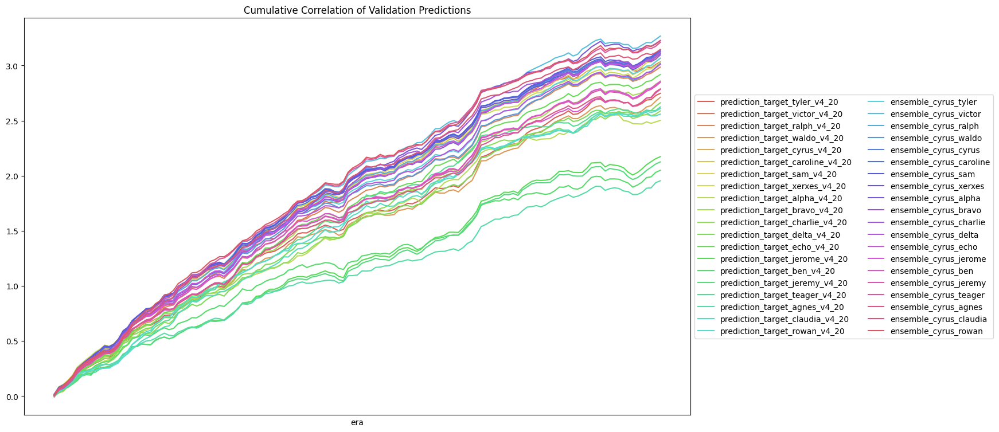

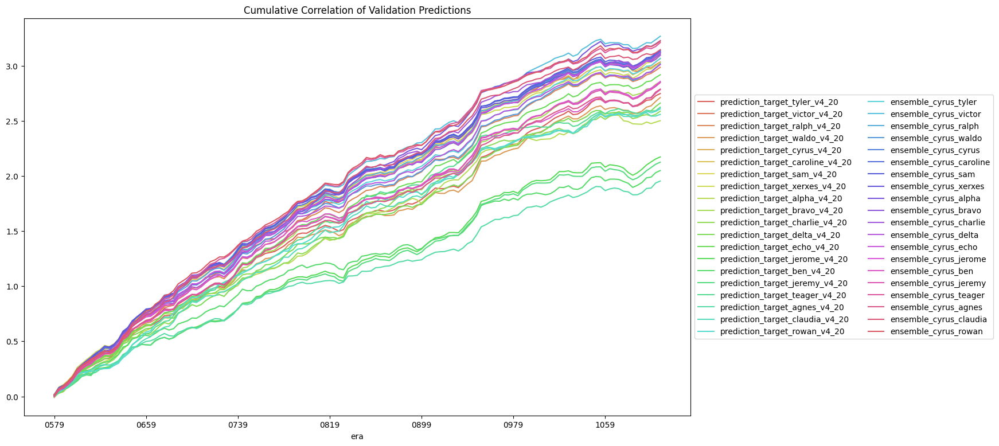

In [72]:
cumsum_corrs_val.plot(
    title="Cumulative Correlation of Validation Predictions",
    figsize=(15, 9),
    color = colors40,
    xticks=[]
)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2)
plt.show()
cumsum_corrs_val.plot(
    title="Cumulative Correlation of Validation Predictions",
    figsize=(15, 9),
    color = colors40
)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2)
plt.show()

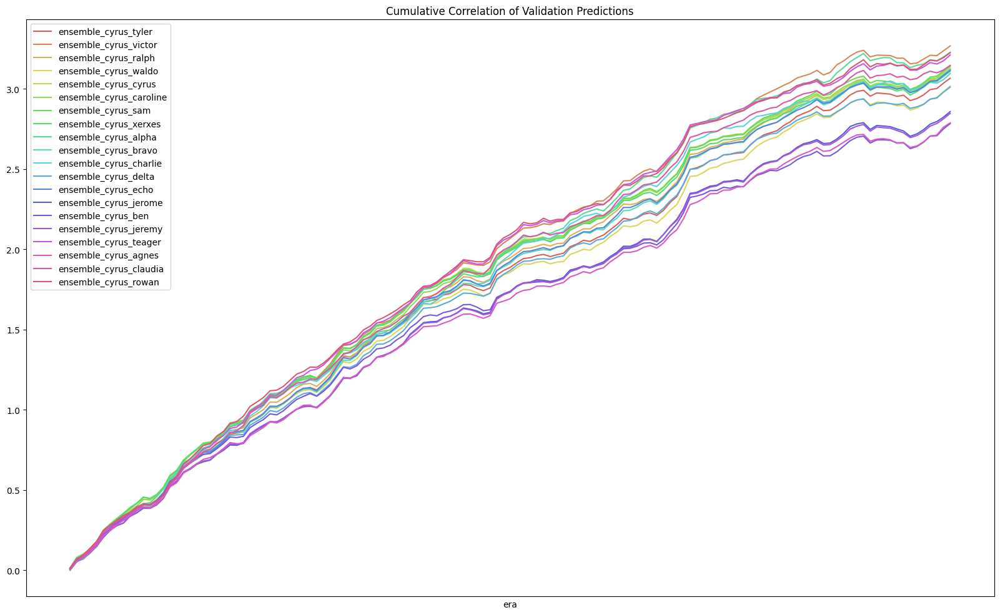

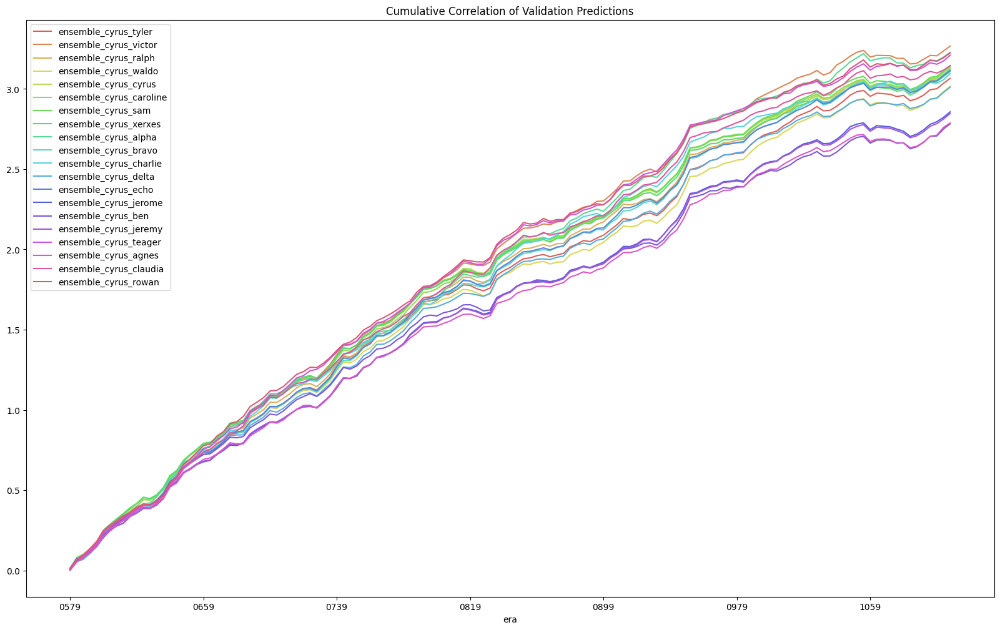

In [148]:
cumsum_corrs_val[all_ensemble_models].plot(
    title="Cumulative Correlation of Validation Predictions",
    figsize=(20, 12),
    color = colors20,
    xticks=[]
)
plt.legend(ncol=1)
plt.show()
cumsum_corrs_val[all_ensemble_models].plot(
    title="Cumulative Correlation of Validation Predictions",
    figsize=(20, 12),
    color = colors20
)
plt.legend(ncol=1)
plt.show()

<Axes: title={'center': 'Cumulative Correlation of Validation Predictions'}, xlabel='era'>

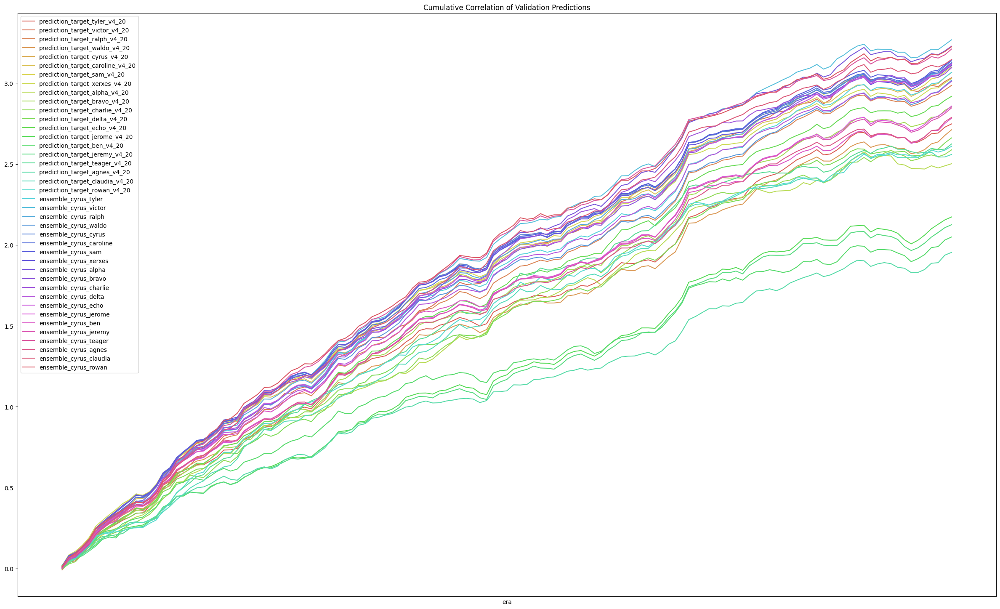

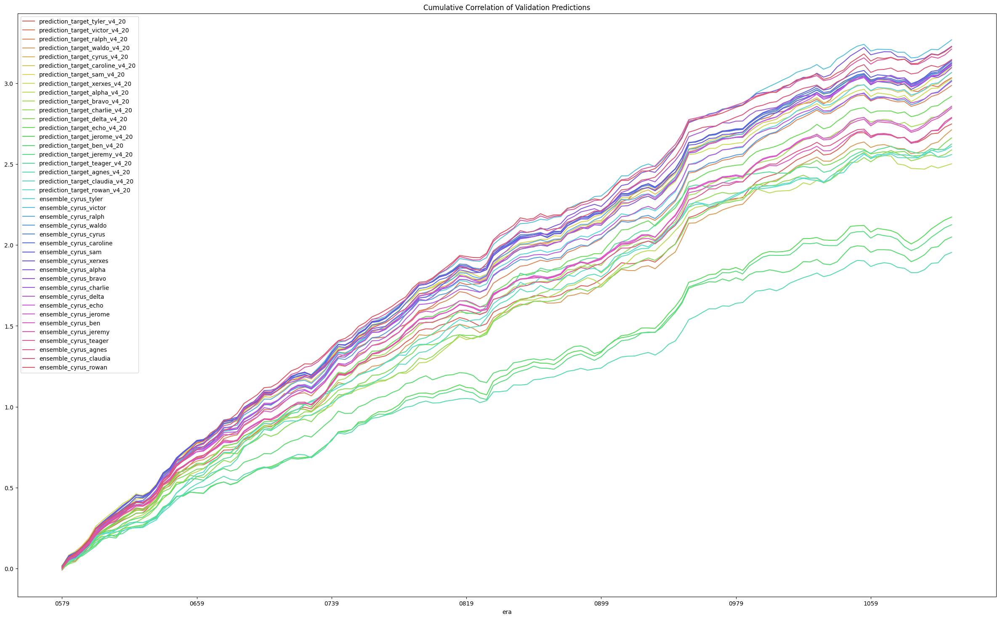

In [75]:
cumsum_corrs_val.plot(
    title="Cumulative Correlation of Validation Predictions",
    figsize=(30, 18),
    color = colors40,
    xticks=[]
)
cumsum_corrs_val.plot(
    title="Cumulative Correlation of Validation Predictions",
    figsize=(30, 18),
    color = colors40
)


<Axes: title={'center': 'Cumulative Correlation of Validation Predictions'}, xlabel='era'>

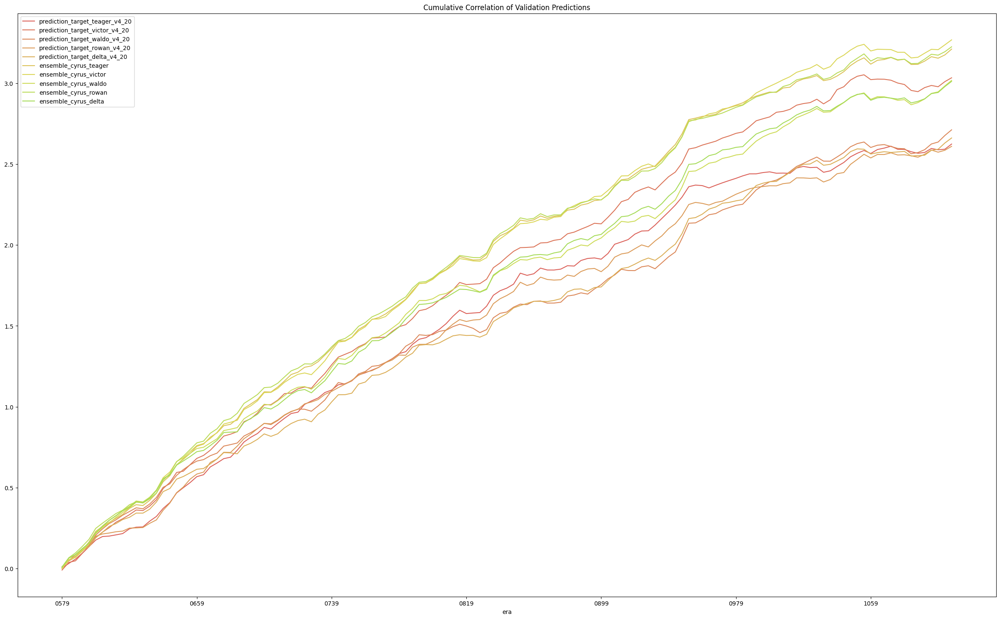

In [95]:
cumsum_corrs_val[all_selected].plot(
  title="Cumulative Correlation of Validation Predictions",
  figsize=(30, 18),
  color=colors40
)

<Axes: title={'center': 'Cumulative Correlation of Validation Predictions'}, xlabel='era'>

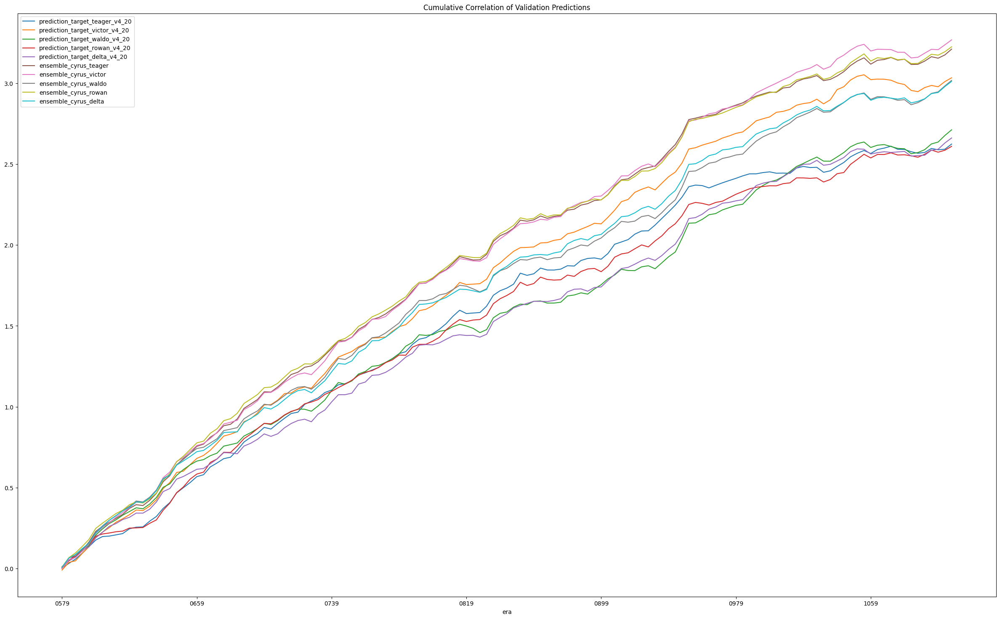

In [96]:
cumsum_corrs_val[all_selected].plot(
  title="Cumulative Correlation of Validation Predictions",
  figsize=(30, 18)
)

<Axes: title={'center': 'Cumulative Correlation of Validation Predictions'}, xlabel='era'>

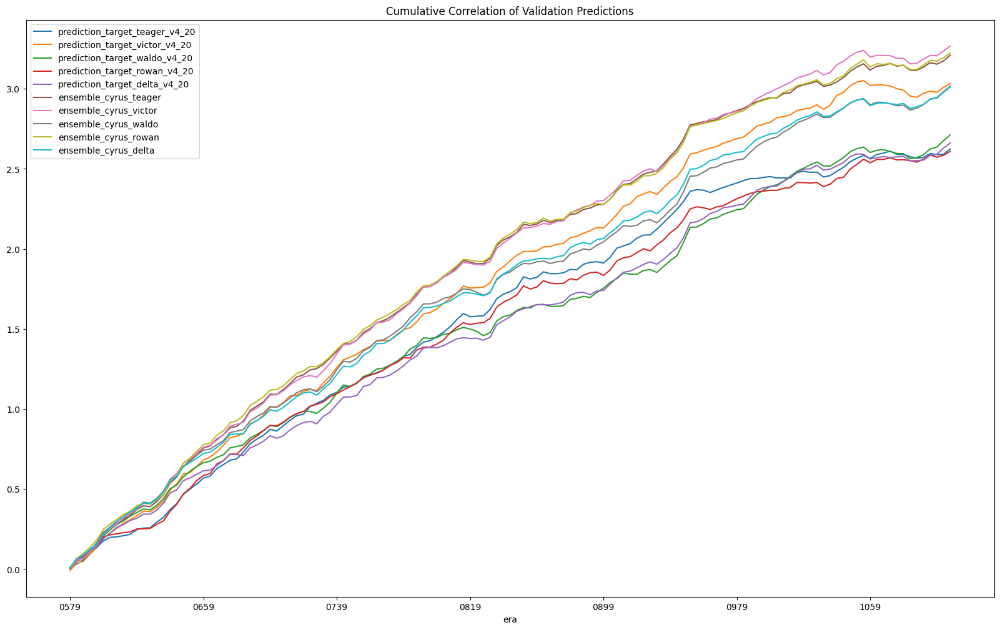

In [97]:
cumsum_corrs_val[all_selected].plot(
  title="Cumulative Correlation of Validation Predictions",
  figsize=(20, 12)
)

<Axes: title={'center': 'Cumulative Correlation of Validation Predictions'}, xlabel='era'>

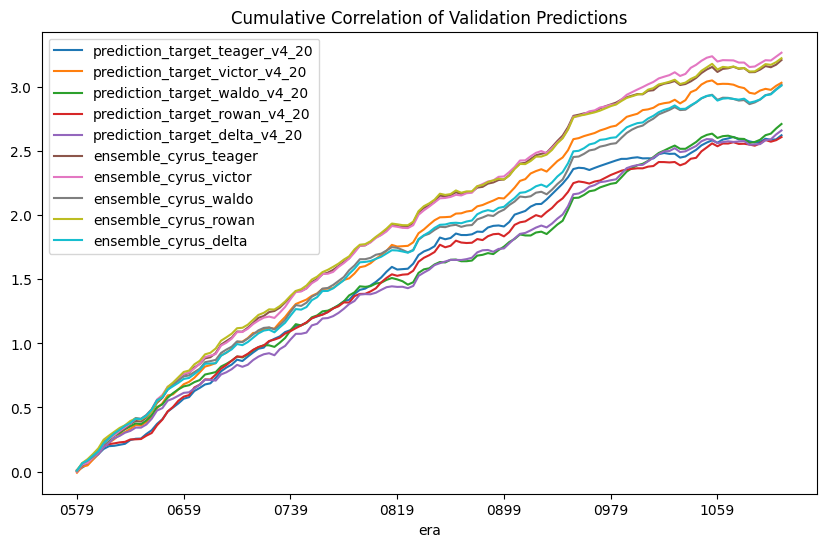

In [98]:
cumsum_corrs_val[all_selected].plot(
  title="Cumulative Correlation of Validation Predictions",
  figsize=(10, 6)
)

In [91]:
cumsum_corrs_val

,prediction_target_tyler_v4_20,prediction_target_victor_v4_20,prediction_target_ralph_v4_20,prediction_target_waldo_v4_20,prediction_target_cyrus_v4_20,prediction_target_caroline_v4_20,prediction_target_sam_v4_20,prediction_target_xerxes_v4_20,prediction_target_alpha_v4_20,prediction_target_bravo_v4_20,...,ensemble_cyrus_charlie,ensemble_cyrus_delta,ensemble_cyrus_echo,ensemble_cyrus_jerome,ensemble_cyrus_ben,ensemble_cyrus_jeremy,ensemble_cyrus_teager,ensemble_cyrus_agnes,ensemble_cyrus_claudia,ensemble_cyrus_rowan
era,,,,,,,,,,,,,,,,,,,,,
0579,-0.002855,-0.008886,0.000790,0.003640,0.010858,0.004606,0.014060,0.017732,0.006224,-0.003705,...,0.000945,0.008444,0.007074,0.009651,0.011793,0.010122,0.001048,0.006898,0.013376,0.010100
0583,0.050825,0.038342,0.056468,0.052207,0.072853,0.063036,0.076428,0.084080,0.038091,0.040786,...,0.054724,0.065045,0.063283,0.066091,0.071438,0.066179,0.051498,0.067343,0.067307,0.067266
0587,0.067298,0.048485,0.062774,0.076533,0.090476,0.082298,0.095027,0.107665,0.059626,0.059574,...,0.070913,0.087453,0.079075,0.088262,0.087994,0.085961,0.076422,0.080381,0.088635,0.097305
0591,0.089659,0.094215,0.099023,0.107641,0.116496,0.111940,0.132864,0.143450,0.096988,0.089230,...,0.106733,0.124000,0.107461,0.113206,0.118012,0.112944,0.114279,0.111195,0.128280,0.137195
0595,0.133368,0.136133,0.135223,0.143726,0.163239,0.156826,0.184380,0.190685,0.137802,0.120181,...,0.150735,0.157801,0.154553,0.151241,0.160445,0.150714,0.164624,0.151018,0.171122,0.180893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1091,2.655951,2.972473,2.886554,2.588803,3.025122,2.958931,2.988351,2.938876,2.468883,2.753302,...,3.026202,2.903288,3.013198,2.744814,2.666581,2.733213,3.136108,2.668333,3.092802,3.148492
1095,2.686833,2.985761,2.917453,2.624187,3.058542,2.986850,3.025037,2.967453,2.488878,2.788342,...,3.040738,2.935191,3.046808,2.779886,2.705766,2.767545,3.163450,2.705593,3.109408,3.178514
1099,2.690986,2.977740,2.930646,2.636166,3.061439,2.996472,3.034745,2.970291,2.475449,2.791511,...,3.035205,2.942331,3.050643,2.796029,2.707143,2.783797,3.154219,2.711791,3.099179,3.172891


Looking at the summary metrics below, we can see that our ensemble seems to have better `mean`, `sharpe`, and `max_drawdown` than our original model. Much more interestingly, however, is that our ensemble with `teager` has even higher sharpe than the ensemble with `victor`!

In [92]:
summary_metrics = get_summary_metrics(correlations, cumsum_corrs_val)
pd.set_option('display.float_format', lambda x: '%f' % x)
summary = pd.DataFrame(summary_metrics)
summary

,mean,std,sharpe,max_drawdown
prediction_target_tyler_v4_20,0.020659,0.021162,0.976262,0.064185
prediction_target_victor_v4_20,0.022805,0.021036,1.084136,0.104255
prediction_target_ralph_v4_20,0.022451,0.021538,1.042384,0.069092
prediction_target_waldo_v4_20,0.020388,0.021202,0.961595,0.072561
prediction_target_cyrus_v4_20,0.023511,0.022403,1.049468,0.072247
prediction_target_caroline_v4_20,0.023046,0.021982,1.048434,0.071106
prediction_target_sam_v4_20,0.023300,0.022018,1.058260,0.095833
prediction_target_xerxes_v4_20,0.022768,0.022701,1.002958,0.076184
prediction_target_alpha_v4_20,0.018809,0.019833,0.948354,0.105787
prediction_target_bravo_v4_20,0.021458,0.021069,1.018456,0.056444


You can see below that `teager` also improves MMC performance significantly.

In [118]:
from numerai_tools.scoring import correlation_contribution

# Download and join in the meta_model for the validation eras
napi.download_dataset(f"{DATA_VERSION}/meta_model.parquet")
validation["meta_model"] = pd.read_parquet(
    f"{DATA_VERSION}/meta_model.parquet"
)["numerai_meta_model"]

def get_mmc(validation, meta_model_col):
    # Compute the per-era mmc between our predictions, the meta model, and the target values
    per_era_mmc = validation.dropna().groupby("era").apply(
        lambda x: correlation_contribution(
            x[prediction_cols], x[meta_model_col], x["target"]
        )
    )

    cumsum_mmc = per_era_mmc.cumsum()

    # compute summary metrics
    summary_metrics = get_summary_metrics(per_era_mmc, cumsum_mmc)
    summary = pd.DataFrame(summary_metrics)

    return per_era_mmc, cumsum_mmc, summary

per_era_mmc, cumsum_mmc, summary = get_mmc(validation, "meta_model")

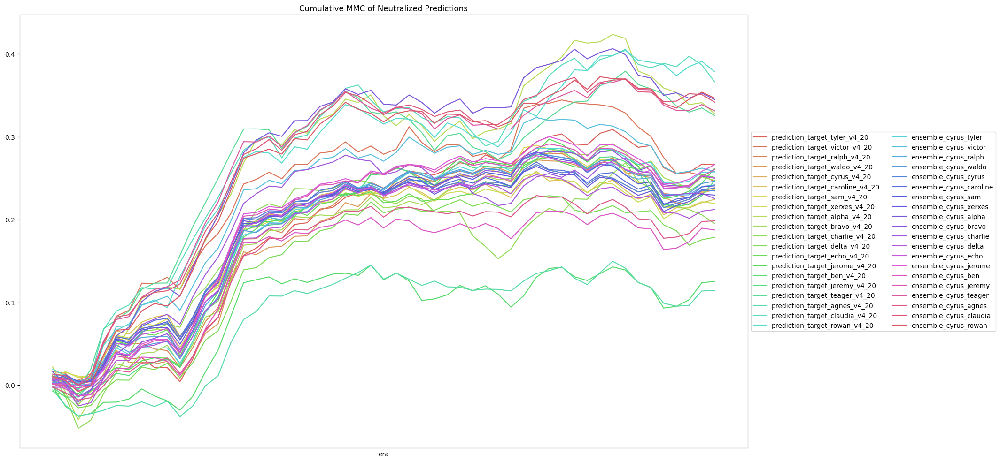

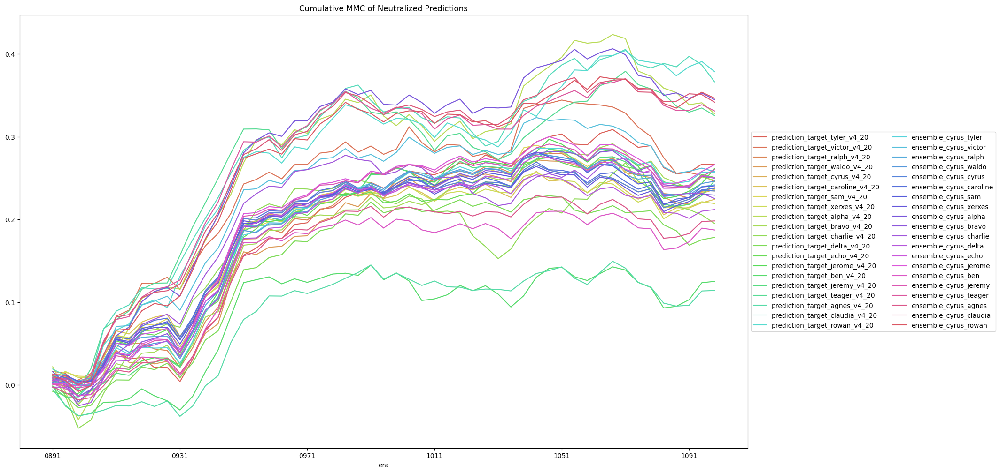

In [119]:
# plot the cumsum mmc performance
cumsum_mmc.plot(
  title="Cumulative MMC of Neutralized Predictions",
  figsize=(20, 12),
  color=colors40,
  xticks=[]
)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2)
plt.show()
cumsum_mmc.plot(
  title="Cumulative MMC of Neutralized Predictions",
  figsize=(20, 12),
  color=colors40
)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2)
plt.show()

In [120]:
pd.set_option('display.float_format', lambda x: '%f' % x)
summary

,mean,std,sharpe,max_drawdown
prediction_target_tyler_v4_20,0.005032,0.013157,0.382455,0.053369
prediction_target_victor_v4_20,0.004642,0.016360,0.283712,0.098445
prediction_target_ralph_v4_20,0.004499,0.013073,0.344167,0.054083
prediction_target_waldo_v4_20,0.004459,0.013212,0.337511,0.056211
prediction_target_cyrus_v4_20,0.004426,0.012664,0.349508,0.052187
prediction_target_caroline_v4_20,0.004235,0.013184,0.321202,0.052521
prediction_target_sam_v4_20,0.004452,0.013202,0.337248,0.075660
prediction_target_xerxes_v4_20,0.004140,0.013353,0.310028,0.055613
prediction_target_alpha_v4_20,0.006187,0.019348,0.319800,0.095655
prediction_target_bravo_v4_20,0.004668,0.013411,0.348038,0.054490


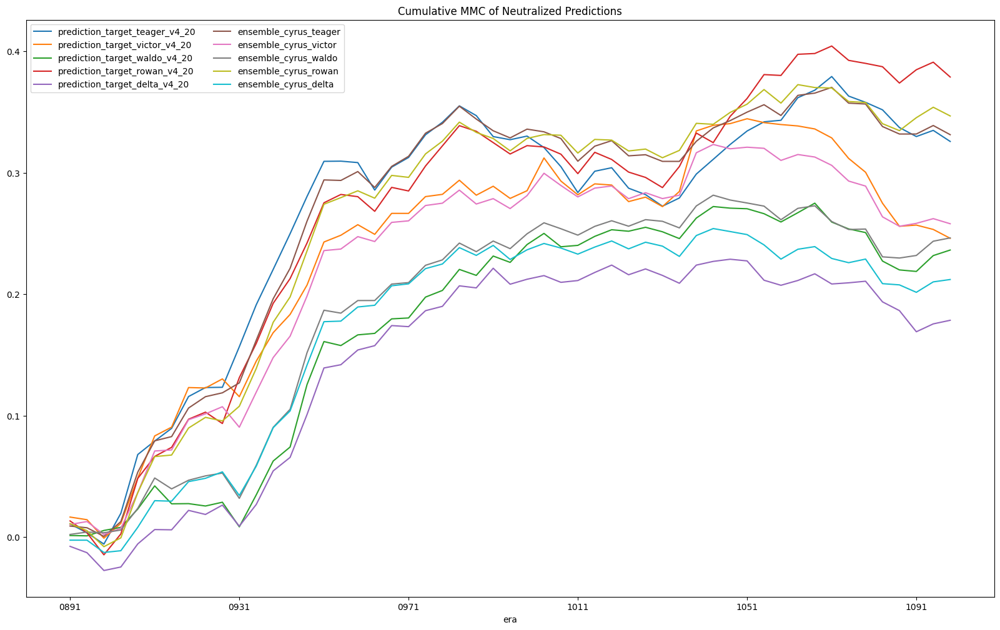

In [121]:
cumsum_mmc[all_selected].plot(
  title="Cumulative MMC of Neutralized Predictions",
  figsize=(20, 12)
)
plt.legend(ncol=2)
plt.show()

In [122]:
cumsum_mmc

,prediction_target_tyler_v4_20,prediction_target_victor_v4_20,prediction_target_ralph_v4_20,prediction_target_waldo_v4_20,prediction_target_cyrus_v4_20,prediction_target_caroline_v4_20,prediction_target_sam_v4_20,prediction_target_xerxes_v4_20,prediction_target_alpha_v4_20,prediction_target_bravo_v4_20,...,ensemble_cyrus_charlie,ensemble_cyrus_delta,ensemble_cyrus_echo,ensemble_cyrus_jerome,ensemble_cyrus_ben,ensemble_cyrus_jeremy,ensemble_cyrus_teager,ensemble_cyrus_agnes,ensemble_cyrus_claudia,ensemble_cyrus_rowan
era,,,,,,,,,,,,,,,,,,,,,
0891,0.004903,0.016474,0.006702,0.001296,0.003505,0.007295,0.009653,0.008615,0.022152,0.001852,...,0.008145,-0.002536,0.005983,0.001615,0.001660,0.000886,0.009077,-0.002334,0.013255,0.011025
0895,-0.002049,0.014308,0.003863,0.001013,0.008472,0.010305,0.015485,0.016447,-0.008415,-0.001260,...,-0.000310,-0.002553,0.006331,0.001394,-0.004628,-0.000679,0.007665,-0.009131,0.011310,0.005299
0899,0.001360,-0.000911,0.006064,0.005449,-0.000225,0.000846,0.010701,0.008969,-0.042384,-0.023605,...,-0.025136,-0.012654,-0.007111,-0.001228,-0.013178,-0.003319,0.000574,-0.017994,-0.000025,-0.007899
0903,0.004303,0.011280,0.014002,0.008007,-0.000151,0.010123,0.010179,0.009434,-0.016155,-0.007467,...,-0.021221,-0.011231,-0.001349,0.001885,-0.011706,-0.001068,0.012760,-0.015189,0.007522,-0.000633
0907,0.022346,0.048717,0.035141,0.023074,0.019954,0.032622,0.027457,0.025202,0.014027,0.002637,...,0.007893,0.008061,0.020847,0.018189,0.003851,0.012195,0.053468,-0.000905,0.051467,0.036603
0911,0.041545,0.083283,0.058111,0.042164,0.050594,0.065405,0.059939,0.060235,0.044236,0.025799,...,0.037733,0.029969,0.050736,0.039507,0.019748,0.035363,0.079259,0.018082,0.082209,0.066268
0915,0.031586,0.090532,0.049580,0.027389,0.048720,0.061711,0.054071,0.056932,0.068476,0.021418,...,0.049037,0.029550,0.047183,0.036401,0.020602,0.032467,0.082737,0.015692,0.085144,0.067556
0919,0.033242,0.123114,0.050733,0.027536,0.063818,0.076195,0.074041,0.070045,0.104752,0.038446,...,0.073031,0.045653,0.061305,0.049465,0.033826,0.046941,0.106249,0.026673,0.105560,0.089783
0923,0.021159,0.122757,0.043572,0.025583,0.072095,0.082027,0.072387,0.067614,0.112563,0.039884,...,0.079754,0.048392,0.064001,0.055636,0.033129,0.053581,0.115602,0.027846,0.112015,0.098573


#### Benchmark Models

It's no accident that a model trained on `teager` ensembles so well. We have seen in our research that models trained or ensembled using `teager` perform extremely well. We even released a benchmark for a [teager ensemble](https://numer.ai/v42_teager_ensemble). We submit predictions for all internally known models [here](https://numer.ai/~benchmark_models) and release files with their predictions.

In [123]:
# download Numerai's benchmark models
napi.download_dataset(f"{DATA_VERSION}/validation_benchmark_models.parquet")
benchmark_models = pd.read_parquet(
    f"{DATA_VERSION}/validation_benchmark_models.parquet"
)
benchmark_models

,era,v43_lgbm_teager60,v43_lgbm_teager20,v43_lgbm_cyrus60,v43_lgbm_cyrus20,v42_example_preds,v42_lgbm_teager60,v42_lgbm_teager20,v42_lgbm_agnes20,v42_lgbm_claudia20,...,v4_lgbm_jerome20,v3_example_preds,v2_example_preds,v41_example_preds,v42_rain_ensemble,v42_rain_ensemble2,v42_teager_plus_cyrus,v42_teager_ensemble,v42_lgbm_ct_blend,v43_lgbm_ct_blend
id,,,,,,,,,,,,,,,,,,,,,
n000101811a8a843,0575,0.331251,0.204456,0.335415,0.201333,0.122215,0.226733,0.127629,0.290235,0.054966,...,0.496148,0.231938,0.616698,0.353321,0.131168,0.062045,0.105143,0.121382,0.105143,0.181970
n001e1318d5072ac,0575,0.382886,0.584010,0.617739,0.772642,0.624193,0.318551,0.493650,0.960025,0.479492,...,0.499479,0.549240,0.632313,0.443056,0.569436,0.605663,0.572975,0.515095,0.572975,0.702061
n002a9c5ab785cbb,0575,0.820737,0.912138,0.435145,0.527587,0.533417,0.895274,0.897564,0.422236,0.905892,...,0.413908,0.343743,0.521549,0.450552,0.634395,0.484072,0.769727,0.792421,0.769727,0.780554
n002ccf6d0e8c5ad,0575,0.965022,0.987716,0.966479,0.973766,0.955445,0.978139,0.989798,0.987716,0.985009,...,0.890069,0.953362,0.884447,0.969602,0.977306,0.966271,0.981262,0.987716,0.981262,0.986467
n0051ab821295c29,0575,0.135332,0.106184,0.122007,0.095773,0.075161,0.156777,0.252967,0.120341,0.280242,...,0.079325,0.462211,0.078493,0.239017,0.064335,0.164689,0.126588,0.100979,0.126588,0.083281
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
nff7e994ee75af3f,1112,0.176711,0.258631,0.528907,0.377732,0.202656,0.145659,0.158529,0.135036,0.090296,...,0.627579,0.470480,0.253115,0.150970,0.283963,0.187743,0.158938,0.187743,0.158938,0.303984
nffd0ebcc308e3b1,1112,0.738100,0.484168,0.612257,0.404699,0.491522,0.650051,0.524208,0.411849,0.664556,...,0.301941,0.152809,0.031461,0.185291,0.532176,0.563841,0.511747,0.556282,0.511747,0.438815
nffd1b37d03314d2,1112,0.564045,0.467620,0.718693,0.620838,0.717875,0.735240,0.436568,0.881920,0.615526,...,0.718693,0.615526,0.780388,0.839019,0.725230,0.902145,0.591828,0.669663,0.591828,0.554035


Because models trained on newer targets perform so well and we release their predictions, it's likely many users will begin to shift their models to include newer data and targets. By extension, the Meta Model will begin to include information from from these new targets.

This means that MMC over the validation period may not be truly indicative of out-of-sample performance. The Meta Model over the early validation period did not have access to newer data/targets and MMC over the validation period may be misleading.

In [124]:
validation["v42_teager_plus_cyrus"] = benchmark_models["v42_teager_plus_cyrus"]

per_era_mmc, cumsum_mmc_teag, summary = get_mmc(validation, "v42_teager_plus_cyrus")

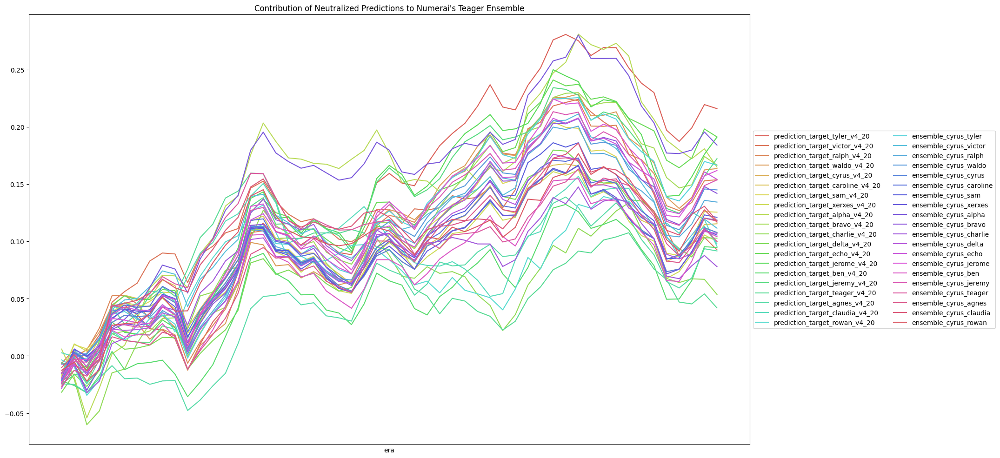

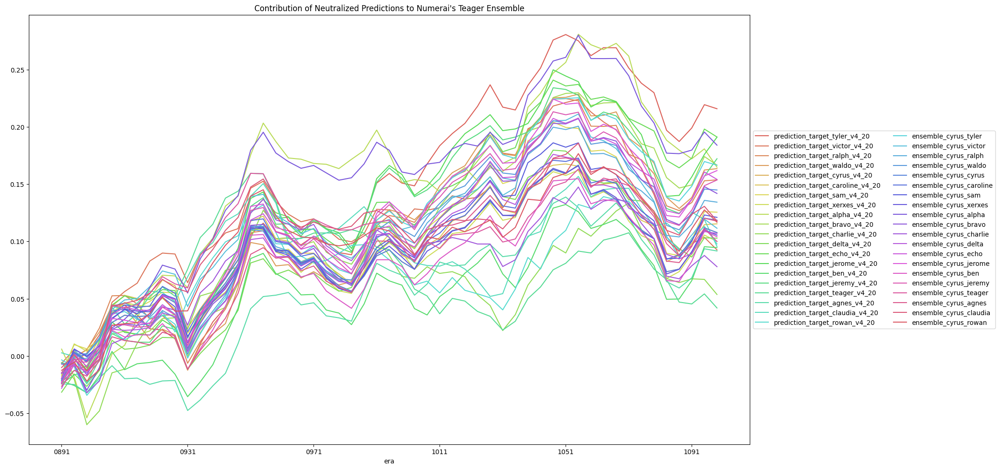

In [125]:
# plot the cumsum mmc performance
cumsum_mmc_teag.plot(
  title="Contribution of Neutralized Predictions to Numerai's Teager Ensemble",
  figsize=(20, 12),
  color=colors40,
  xticks=[]
)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2)
plt.show()
cumsum_mmc_teag.plot(
  title="Contribution of Neutralized Predictions to Numerai's Teager Ensemble",
  figsize=(20, 12),
  color=colors40
)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2)
plt.show()

In [126]:
pd.set_option('display.float_format', lambda x: '%f' % x)
summary

,mean,std,sharpe,max_drawdown
prediction_target_tyler_v4_20,0.004073,0.015841,0.257118,0.093422
prediction_target_victor_v4_20,0.001747,0.016334,0.106969,0.136661
prediction_target_ralph_v4_20,0.002901,0.015490,0.187294,0.097834
prediction_target_waldo_v4_20,0.003086,0.015986,0.193033,0.099839
prediction_target_cyrus_v4_20,0.002033,0.014508,0.140117,0.093143
prediction_target_caroline_v4_20,0.002177,0.014831,0.146763,0.085357
prediction_target_sam_v4_20,0.002368,0.015593,0.151866,0.116644
prediction_target_xerxes_v4_20,0.001887,0.015085,0.125083,0.094534
prediction_target_alpha_v4_20,0.003110,0.018323,0.169739,0.116095
prediction_target_bravo_v4_20,0.003144,0.016202,0.194055,0.083268


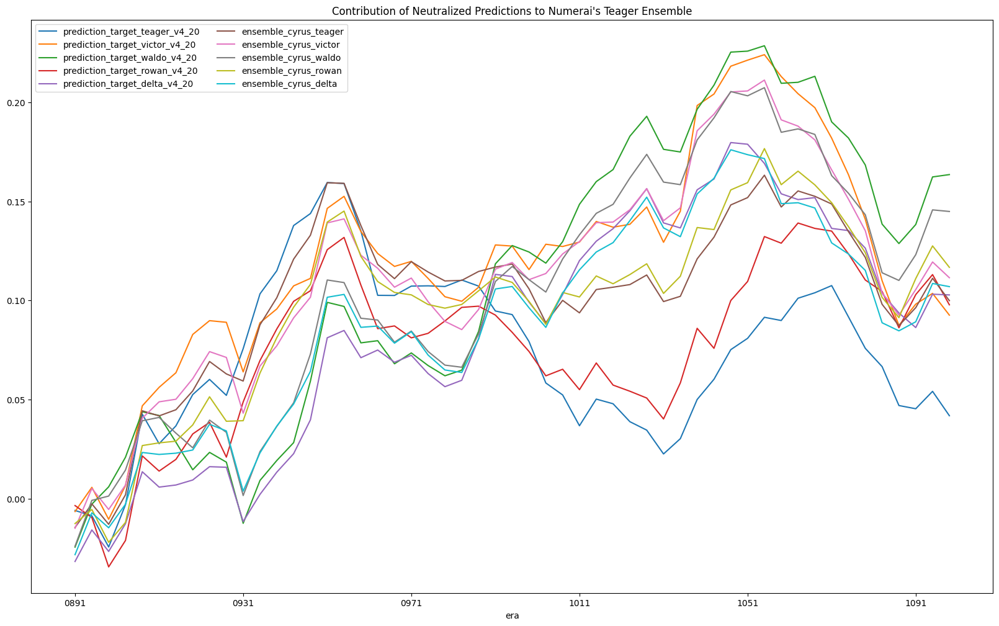

In [131]:
cumsum_mmc_teag[all_selected].plot(
  title="Contribution of Neutralized Predictions to Numerai's Teager Ensemble",
  figsize=(20, 12)
)
plt.legend(ncol=2)
plt.show()

In [132]:
cumsum_mmc_teag

,prediction_target_tyler_v4_20,prediction_target_victor_v4_20,prediction_target_ralph_v4_20,prediction_target_waldo_v4_20,prediction_target_cyrus_v4_20,prediction_target_caroline_v4_20,prediction_target_sam_v4_20,prediction_target_xerxes_v4_20,prediction_target_alpha_v4_20,prediction_target_bravo_v4_20,...,ensemble_cyrus_charlie,ensemble_cyrus_delta,ensemble_cyrus_echo,ensemble_cyrus_jerome,ensemble_cyrus_ben,ensemble_cyrus_jeremy,ensemble_cyrus_teager,ensemble_cyrus_agnes,ensemble_cyrus_claudia,ensemble_cyrus_rowan
era,,,,,,,,,,,,,,,,,,,,,
0891,-0.020090,-0.006517,-0.019303,-0.024480,-0.021634,-0.017658,-0.015330,-0.016573,0.005925,-0.021683,...,-0.015424,-0.028286,-0.019756,-0.023708,-0.022763,-0.024422,-0.014560,-0.026504,-0.010223,-0.012589
0895,-0.005275,0.005696,-0.000416,-0.002783,0.002416,0.004268,0.009811,0.010498,-0.018351,-0.004961,...,-0.007725,-0.007171,0.001568,-0.002985,-0.008094,-0.005133,-0.002659,-0.012635,0.001053,-0.005471
0899,0.002492,-0.010421,0.005142,0.005942,-0.005344,-0.003873,0.006125,0.004069,-0.054142,-0.023451,...,-0.032158,-0.014714,-0.009225,-0.003247,-0.013142,-0.005429,-0.012957,-0.017697,-0.013311,-0.022056
0903,0.018189,0.006609,0.024307,0.020892,0.003501,0.014776,0.014649,0.013826,-0.027960,0.002687,...,-0.022020,-0.002808,0.006970,0.010014,-0.000253,0.007005,0.001926,-0.004424,-0.002629,-0.011989
0907,0.044235,0.046819,0.052481,0.043838,0.029233,0.043305,0.037762,0.035511,0.001728,0.019075,...,0.010743,0.023292,0.035872,0.032691,0.022428,0.026699,0.044341,0.016716,0.043223,0.026783
0911,0.044266,0.056171,0.052809,0.041952,0.035492,0.052940,0.046698,0.046639,0.009227,0.021591,...,0.015227,0.022305,0.042617,0.031219,0.016477,0.027113,0.041754,0.013407,0.045917,0.028144
0915,0.035752,0.063534,0.045328,0.028472,0.034330,0.050137,0.041700,0.044124,0.032699,0.018193,...,0.026809,0.022939,0.040065,0.029025,0.018457,0.025134,0.044863,0.012073,0.048555,0.028992
0919,0.023703,0.082860,0.032091,0.014558,0.035148,0.050602,0.047579,0.043062,0.059269,0.021800,...,0.037069,0.024535,0.039739,0.028286,0.018260,0.025825,0.054349,0.009627,0.054865,0.037194
0923,0.022618,0.089821,0.035131,0.023350,0.052936,0.066368,0.055669,0.050373,0.070428,0.032666,...,0.052196,0.037516,0.052927,0.044647,0.028203,0.042645,0.069208,0.020676,0.066900,0.051407


Ouch. Our teager models actually perform the worst. This means we aren't adding very useful signal to a model that Numerai already created, but this should not be surprising since we are training basically the same model. The model trained with `xerxes`, however, still does well against Numerai's model. What do you think this means?

It's also helpful to if we measured the contribution of your models to all of Numerai's benchmark models. We call this Benchmark Model Contribution or `BMC`.  On the website, `BMC` measures your model's contribution to a weighted ensemble of all of our Benchmark Models.

This is an important metric to track because it tells you how additive your model is to Numerai's known models and, by extension, how additive you might be to the Meta Model in the future.

To keep things simple, we will use an unweighted ensemble of Numerai's Benchmarks to measure your models' BMC, let's take a look:

In [133]:
validation["numerai_benchmark"] = (
    benchmark_models
    .groupby("era")
    .apply(lambda x: x.mean(axis=1))
    .reset_index()
    .set_index("id")[0]
)

per_era_mmc, cumsum_mmc, summary = get_mmc(validation, "numerai_benchmark")

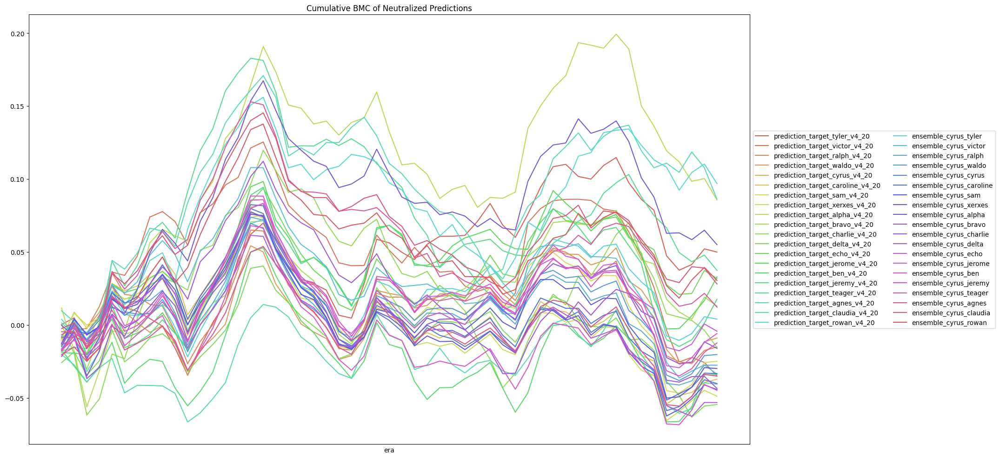

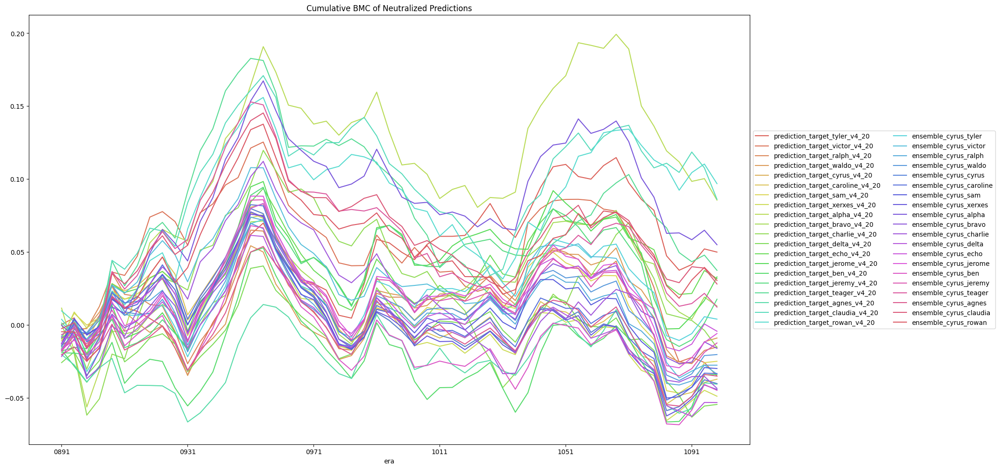

In [134]:
# plot the cumsum mmc performance
cumsum_mmc.plot(
  title="Cumulative BMC of Neutralized Predictions",
  figsize=(20, 12),
  color=colors40,
  xticks=[]
)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2)
plt.show()
cumsum_mmc.plot(
  title="Cumulative BMC of Neutralized Predictions",
  figsize=(20, 12),
  color=colors40,
)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2)
plt.show()

In [135]:
pd.set_option('display.float_format', lambda x: '%f' % x)
summary

,mean,std,sharpe,max_drawdown
prediction_target_tyler_v4_20,0.000942,0.013506,0.069727,0.077239
prediction_target_victor_v4_20,-0.000661,0.015108,-0.043767,0.160415
prediction_target_ralph_v4_20,-0.000286,0.012781,-0.022387,0.091496
prediction_target_waldo_v4_20,-0.000170,0.013360,-0.012711,0.081201
prediction_target_cyrus_v4_20,-0.000759,0.012118,-0.062666,0.138525
prediction_target_caroline_v4_20,-0.000702,0.012585,-0.055804,0.137179
prediction_target_sam_v4_20,-0.000471,0.012826,-0.036721,0.122186
prediction_target_xerxes_v4_20,-0.000923,0.012443,-0.074157,0.142529
prediction_target_alpha_v4_20,0.001614,0.018507,0.087222,0.113708
prediction_target_bravo_v4_20,0.000244,0.013660,0.017835,0.084494


In [136]:
cumsum_mmc

,prediction_target_tyler_v4_20,prediction_target_victor_v4_20,prediction_target_ralph_v4_20,prediction_target_waldo_v4_20,prediction_target_cyrus_v4_20,prediction_target_caroline_v4_20,prediction_target_sam_v4_20,prediction_target_xerxes_v4_20,prediction_target_alpha_v4_20,prediction_target_bravo_v4_20,...,ensemble_cyrus_charlie,ensemble_cyrus_delta,ensemble_cyrus_echo,ensemble_cyrus_jerome,ensemble_cyrus_ben,ensemble_cyrus_jeremy,ensemble_cyrus_teager,ensemble_cyrus_agnes,ensemble_cyrus_claudia,ensemble_cyrus_rowan
era,,,,,,,,,,,,,,,,,,,,,
0891,-0.014103,0.000292,-0.012721,-0.018106,-0.014802,-0.010930,-0.008590,-0.009705,0.011524,-0.015786,...,-0.008439,-0.021671,-0.013098,-0.017290,-0.016653,-0.017994,-0.006691,-0.020482,-0.002536,-0.004689
0895,-0.008112,0.004851,-0.002936,-0.005474,0.000653,0.002454,0.007985,0.008825,-0.018090,-0.007166,...,-0.008546,-0.009562,-0.000694,-0.005488,-0.010411,-0.007593,-0.002201,-0.015073,0.001439,-0.004892
0899,-0.005477,-0.014824,-0.002565,-0.002036,-0.011634,-0.010271,-0.000162,-0.002107,-0.056297,-0.030280,...,-0.036833,-0.022224,-0.016391,-0.010800,-0.020418,-0.012900,-0.015458,-0.025077,-0.015924,-0.024376
0903,0.006362,0.000014,0.012690,0.008726,-0.006170,0.004817,0.005012,0.004154,-0.031438,-0.007540,...,-0.029142,-0.014244,-0.003853,-0.001509,-0.011581,-0.004400,-0.002210,-0.015500,-0.007078,-0.016034
0907,0.027341,0.036234,0.035755,0.026411,0.014595,0.028317,0.023197,0.020835,-0.004639,0.004104,...,-0.000587,0.006638,0.019880,0.015917,0.005895,0.010073,0.036613,0.000521,0.035089,0.019221
0911,0.012041,0.033917,0.020912,0.008983,0.006539,0.023420,0.017828,0.017548,-0.003909,-0.006277,...,-0.007690,-0.009403,0.011965,-0.000608,-0.014314,-0.004440,0.024532,-0.017225,0.028189,0.011196
0915,0.009308,0.047099,0.019607,0.001479,0.011592,0.026645,0.018903,0.021211,0.023801,-0.004100,...,0.009818,-0.002565,0.015578,0.003223,-0.006499,-0.000418,0.033830,-0.012677,0.036993,0.018270
0919,0.004375,0.073905,0.014019,-0.005107,0.020168,0.034657,0.032391,0.027828,0.056248,0.006719,...,0.027789,0.006797,0.022979,0.009773,0.000357,0.007552,0.051564,-0.008078,0.051598,0.034764
0923,-0.000875,0.077679,0.012957,-0.000536,0.034188,0.046540,0.036689,0.031352,0.065508,0.014088,...,0.039741,0.015799,0.032188,0.021797,0.006439,0.020069,0.063976,-0.000825,0.061115,0.046567


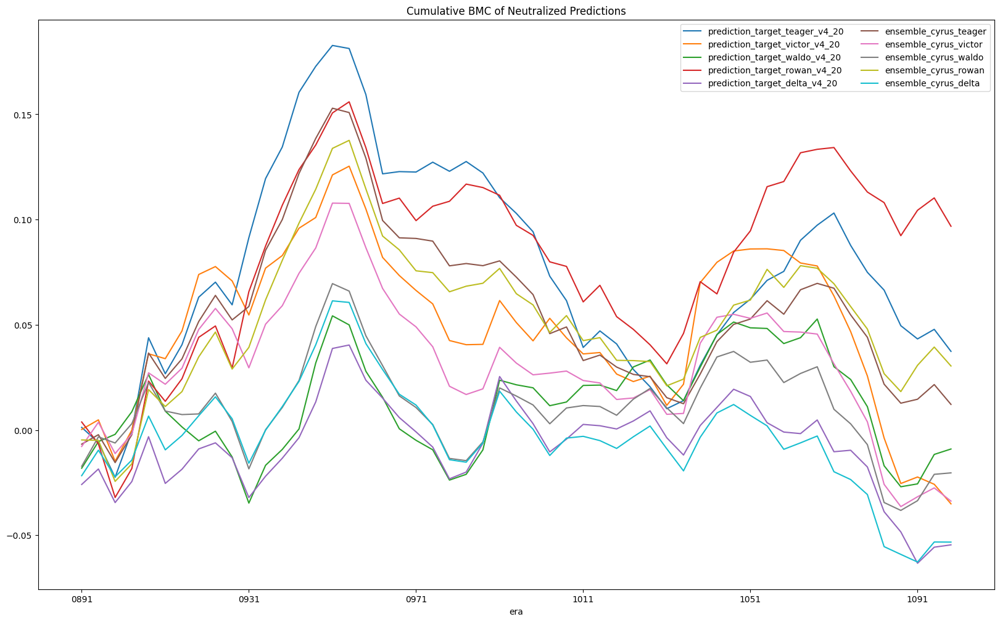

In [138]:
cumsum_mmc[all_selected].plot(
  title="Cumulative BMC of Neutralized Predictions",
  figsize=(20, 12)
)
plt.legend(ncol=2)
plt.show()

Looking at the results above, none of these models seem very additive to models that Numerai can already create. It will take some research and experimentation to find something additive to Numerai's benchmarks.

If you are interested in learning more about targets, we highly encourage you to read up on these forum posts
- https://forum.numer.ai/t/how-to-ensemble-models/4034
- https://forum.numer.ai/t/target-jerome-is-dominating-and-thats-weird/6513

In [41]:
# Numerai's model upload framework does not currently include numerai-tools
import numpy as np

def neutralize(
    df: pd.DataFrame,
    neutralizers: np.ndarray,
    proportion: float = 1.0,
) -> pd.DataFrame:
    """Neutralize each column of a given DataFrame by each feature in a given
    neutralizers DataFrame. Neutralization uses least-squares regression to
    find the orthogonal projection of each column onto the neutralizers, then
    subtracts the result from the original predictions.

    Arguments:
        df: pd.DataFrame - the data with columns to neutralize
        neutralizers: pd.DataFrame - the neutralizer data with features as columns
        proportion: float - the degree to which neutralization occurs

    Returns:
        pd.DataFrame - the neutralized data
    """
    assert not neutralizers.isna().any().any(), "Neutralizers contain NaNs"
    assert len(df.index) == len(neutralizers.index), "Indices don't match"
    assert (df.index == neutralizers.index).all(), "Indices don't match"
    df[df.columns[df.std() == 0]] = np.nan
    df_arr = df.values
    neutralizer_arr = neutralizers.values
    neutralizer_arr = np.hstack(
        # add a column of 1s to the neutralizer array in case neutralizer_arr is a single column
        (neutralizer_arr, np.array([1] * len(neutralizer_arr)).reshape(-1, 1))
    )
    inverse_neutralizers = np.linalg.pinv(neutralizer_arr, rcond=1e-6)
    adjustments = proportion * neutralizer_arr.dot(inverse_neutralizers.dot(df_arr))
    neutral = df_arr - adjustments
    return pd.DataFrame(neutral, index=df.index, columns=df.columns)

## 4. Model Upload

In [42]:
selected_models

['prediction_target_teager_v4_20',
 'prediction_target_victor_v4_20',
 'prediction_target_waldo_v4_20',
 'prediction_target_rowan_v4_20',
 'prediction_target_delta_v4_20']

In [139]:
ensemble_models

['ensemble_cyrus_teager',
 'ensemble_cyrus_victor',
 'ensemble_cyrus_waldo',
 'ensemble_cyrus_rowan',
 'ensemble_cyrus_delta']

In [140]:
all_selected

['prediction_target_teager_v4_20',
 'prediction_target_victor_v4_20',
 'prediction_target_waldo_v4_20',
 'prediction_target_rowan_v4_20',
 'prediction_target_delta_v4_20',
 'ensemble_cyrus_teager',
 'ensemble_cyrus_victor',
 'ensemble_cyrus_waldo',
 'ensemble_cyrus_rowan',
 'ensemble_cyrus_delta']

In [43]:
# we now give you access to the live_benchmark_models if you want to use them in your ensemble
curr_selected_model = "rowan"
def predict_ensemble(
    live_features: pd.DataFrame,
    live_benchmark_models: pd.DataFrame
) -> pd.DataFrame:
    favorite_targets = [
        'target_cyrus_v4_20',
        'target_' + curr_selected_model + '_v4_20'
    ]
    # generate predictions from each model
    predictions = pd.DataFrame(index=live_features.index)
    for target in favorite_targets:
        predictions[target] = models[target].predict(live_features[feature_cols])
    # ensemble predictions
    ensemble = predictions.rank(pct=True).mean(axis=1)
    # format submission
    submission = ensemble.rank(pct=True, method="first")
    return submission.to_frame("prediction")

In [44]:
# Quick test
napi.download_dataset(f"{DATA_VERSION}/live_int8.parquet")
live_features = pd.read_parquet(f"{DATA_VERSION}/live_int8.parquet", columns=feature_cols)
predict_ensemble(live_features, benchmark_models)

v4.3/live_int8.parquet: 6.60MB [00:00, 13.1MB/s]                            


,prediction
id,
n001323798843d32,0.408477
n0017a5b56a70496,0.800778
n0017cda4c290bf2,0.692875
n001f38704423a4a,0.150491
n004d2c8460d33a3,0.533170
...,...
nffd162dd2c7d68b,0.279894
nffd8afd6dc039a7,0.873669
nffe176d37262b15,0.891278


In [45]:
# Use the cloudpickle library to serialize your function and its dependencies
import cloudpickle
p = cloudpickle.dumps(predict_ensemble)
with open("predict_ensemble_t20s_" + curr_selected_model + ".pkl", "wb") as f:
    f.write(p)

In [46]:
# Download file if running in Google Colab
try:
    from google.colab import files
    files.download('predict_ensemble_t20s_' + curr_selected_model + '.pkl')
except:
    pass

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>